In [1]:
import os, sys, glob

import numpy as np
import scipy as sp
import healpy as hp
import astropy as ap
import time as ttime
import matplotlib as mpl
import pytz

from datetime import datetime
from matplotlib import pyplot as plt
from numpy import linalg as laj
from scipy import ndimage, signal, stats

sys.path.append('/users/tom/desktop/repos/maria/maria')
exec(open('/users/tom/mpl_prefs').read())

In [2]:
import maria 
from maria import utils

import importlib
importlib.reload(maria)
importlib.reload(utils)

<module 'maria.utils' from '/Users/tom/Desktop/repos/maria/maria/utils.py'>

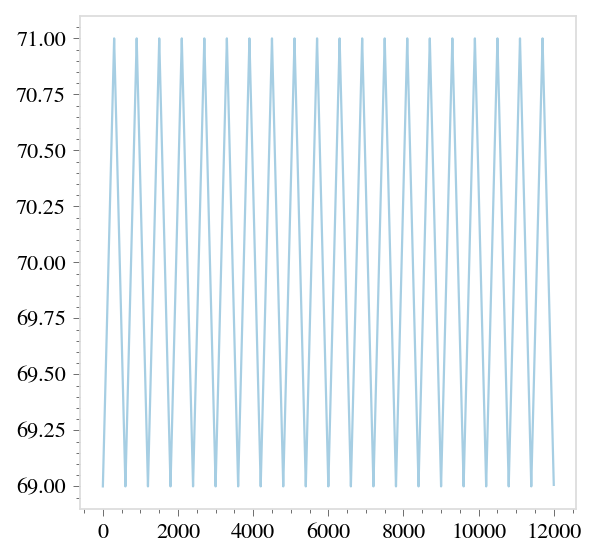

In [3]:
res = 50
max_depth = 5e3

time = np.arange(0, 1200, 0.1)

centers = ()

azim, elev = maria.utils.baf_pointing(time, 
                                        period=60, 
                                        centers=np.radians([70,60]), 
                                        throws=np.radians([1,0]), options={'k':np.pi})

plt.plot(np.degrees(azim))

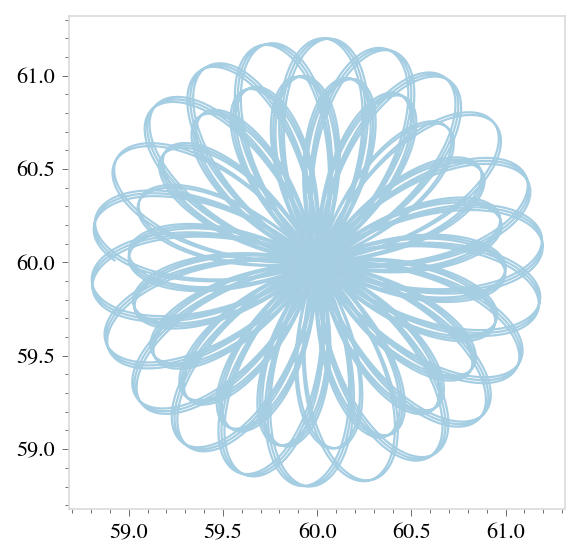

In [3]:
res = 50
max_depth = 5e3

time = np.arange(0, 1200, 0.1)

centers = ()

azim, elev = maria.utils.daisy_pointing(time, 
                                        period=60, 
                                        centers=np.radians([60,60]), 
                                        throws=np.radians([1,1]))

plt.plot(np.degrees(azim), np.degrees(elev), lw=1e0)

In [4]:
def _beam_sigma(z, primary_size, nu):
    
    c  = 2.998e8
    n  = 1
    w0 = primary_size / np.sqrt(2*np.log(2))
    zR = np.pi * w0 ** 2 * n * nu / c
    
    return 0.5 * w0 * np.sqrt(1 + (z/zR) ** 2)
    


In [5]:
_beam_sigma(5000, primary_size, nu)

NameError: name 'primary_size' is not defined

In [26]:
def get_extrusion_products(time, azim, elev, 
                           baseline, 
                           field_of_view, 
                           min_frequency,
                           wind_velocity,
                           wind_direction, 
                           max_depth=3000, 
                           extrusion_step=1,
                           min_res=10, 
                           max_res=100):
    '''
    For the Kolomogorov-Taylor model. It works the same as one of those pasta extruding machines (https://youtu.be/TXtm_eNaIwQ). This function figures out the shape of the hole.
    
    The inputs are:
    
    azim, elev: time-ordered pointing
    '''
    
    # Within this function, we work in the frame of wind-relative pointing phi'. The elevation stays the same. We define: 
    # 
    # phi' -> phi - phi_w
    #
    # where phi_w is the wind bearing, i.e. the direction the wind comes from. This means that:
    #
    # For phi' = 0°  you are looking into the wind
    # For phi' = 90° the wind is going from left to right in your field of view.
    #
    # We further define the frame (x, y, z) = (r cos phi' sin theta, r sin phi' sin theta, r sin theta) 
    
    
    n_baseline = len(baseline)
    
    # this converts the $(x, y, z)$ vertices of a beam looking straight up to the $(x, y, z)$ vertices of 
    # the time-ordered pointing of the beam in the frame of the wind direction.
    elev_rotation_matrix  = sp.spatial.transform.Rotation.from_euler('y', np.pi/2 - elev).as_matrix()
    azim_rotation_matrix  = sp.spatial.transform.Rotation.from_euler('z', np.pi/2 - azim + wind_direction).as_matrix()
    total_rotation_matrix = np.matmul(azim_rotation_matrix, elev_rotation_matrix)

    # this defines the maximum size of the beam that we have to worry about 
    max_beam_radius      = _beam_sigma(max_depth, primary_size=primary_sizes, nu=5e9)
    max_boresight_offset = max_beam_radius + max_depth * field_of_view / 2

    # this returns a list of time-ordered vertices, which can used to construct a convex hull
    time_ordered_vertices_list = []
    for _min_radius, _max_radius, _baseline in zip(primary_sizes/2, max_boresight_offset, baseline):

        _rot_baseline = np.matmul(sp.spatial.transform.Rotation.from_euler('z', wind_direction).as_matrix(), _baseline)
        
        _vertices = np.c_[np.r_[[_.ravel() for _ in np.meshgrid([-_min_radius, _min_radius], [-_min_radius, _min_radius], [0])]], 
                          np.r_[[_.ravel() for _ in np.meshgrid([-_max_radius, _max_radius], [-_max_radius, _max_radius], [max_depth])]]]
        
        time_ordered_vertices_list.append(_rot_baseline[None] + np.swapaxes(np.matmul(total_rotation_matrix, _vertices), 1, -1).reshape(-1, 3))

    # these are the bounds in space that we have to worry about. it has shape (3, 2)
    extrusion_bounds = np.c_[np.min([np.min(tov, axis=0) for tov in time_ordered_vertices_list], axis=0),
                             np.max([np.max(tov, axis=0) for tov in time_ordered_vertices_list], axis=0)]

    # here we make the layers of the atmosphere given the bounds of $z$ and the specified resolution; we use 
    # regular layers to make interpolation more efficient later
    min_height = np.max([np.max(tov[:,2][tov[:,2] < np.median(tov[:,2])]) for tov in time_ordered_vertices_list])
    max_height = np.min([np.min(tov[:,2][tov[:,2] > np.median(tov[:,2])]) for tov in time_ordered_vertices_list])
    
    height_samples = np.linspace(min_height, max_height, 1024)
    dh = np.gradient(height_samples).mean()
    dheight_dindex = np.interp(height_samples, [min_height, max_height], [min_res, max_res])
    dindex_dheight = 1 / dheight_dindex
    n_layers = int(np.sum(dindex_dheight * dh))
    layer_heights = sp.interpolate.interp1d(np.cumsum(dindex_dheight * dh), 
                                            height_samples, 
                                            bounds_error=False, 
                                            fill_value='extrapolate')(1 + np.arange(n_layers))

    # here we define the cells through which turbulence will be extruded.
    layer_res = np.gradient(layer_heights)
    x_min, x_max = extrusion_bounds[0,0], extrusion_bounds[0,1]
    n_per_layer = ((x_max - x_min) / layer_res).astype(int)
    cell_x = np.concatenate([np.linspace(x_min, x_max, n) for i, (res, n) in enumerate(zip(layer_res, n_per_layer))])
    cell_z = np.concatenate([h * np.ones(n) for i, (h, n) in enumerate(zip(layer_heights, n_per_layer))])
    cell_res = np.concatenate([res * np.ones(n) for i, (res, n) in enumerate(zip(layer_res, n_per_layer))])
    
    extrusion_cells = np.c_[cell_x, cell_z]
    extrusion_shift = np.c_[cell_res, np.zeros(len(cell_z))]
    
    eps = 1e-6
    
    in_view = np.zeros(len(extrusion_cells)).astype(bool)
    for tov in time_ordered_vertices_list:
        
        baseline_in_view = np.zeros(len(extrusion_cells)).astype(bool)

        hull = sp.spatial.ConvexHull(tov[:,[0,2]]) # we only care about the $(x, z)$ dimensions here
        A, b = hull.equations[:, :-1], hull.equations[:, -1:]
        
        for shift_factor in [-1, 0, +1]:
        
            baseline_in_view |= np.all((extrusion_cells + shift_factor * extrusion_shift) @ A.T + b.T < eps, axis=1)

        in_view |= baseline_in_view # if the cell is in view of any of the baselines, keep it!
        
        #plt.scatter(tov[:, 0], tov[:, 2], s=1e0)

    # here we define the extrusion axis
    y_min, y_max = extrusion_bounds[1,0], extrusion_bounds[1,1] + wind_velocity * time.ptp()
    extrustion_axis = np.arange(y_min, y_max, extrusion_step)
    
    return extrusion_cells[in_view].T, extrustion_axis, cell_res[in_view]
    
    





class KolmogorovTaylorModel():
    
    def __init__(self, 
                 time, 
                 azim, 
                 elev, 
                 baseline, 
                 field_of_view, 
                 min_frequency,
                 wind_velocity,
                 wind_direction, 
                 extrusion_step=1,
                 outer_scale=600,
                 min_res=10, 
                 max_res=100,
                 max_depth=3000
                ):
        
        
        self.time = time
        self.azim = azim
        self.elev = elev
        
        self.baseline       = baseline
        self.field_of_view  = field_of_view
        self.min_frequency  = min_frequency
        self.wind_direction = wind_direction
        self.wind_velocity  = wind_velocity
        self.extrusion_step = extrusion_step
        self.min_res = min_res
        self.max_res = max_res
        self.max_depth = max_depth
        
        self.outer_scale = outer_scale
        
        
        (self.cX, self.cZ), self.Y, self.cres = get_extrusion_products(self.time, self.azim, self.elev, 
                                                                       self.baseline, 
                                                                       self.field_of_view, 
                                                                       self.min_frequency,
                                                                       self.wind_velocity,
                                                                       self.wind_direction, 
                                                                       self.max_depth, 
                                                                       self.extrusion_step,
                                                                       self.min_res, 
                                                                       self.max_res)
        
        self.layer_heights, self.layer_index = np.unique(self.cZ, return_inverse=True)
        self.n_layers = len(self.layer_heights)

        self.dY, self.n_cells = np.gradient(self.Y).mean(), len(self.cX)
        self.n_baseline  = len(self.baseline)
        self.n_extrusion = len(self.Y)
        self.n_history   = int(2 * self.outer_scale / self.dY) + 1
        
        self.initialized = False
        
    def initialize(self):
        
        max_spacing = int(self.n_cells / 1.1)
        iter_samples = [np.random.choice(self.n_cells, int(self.n_cells / np.minimum(2**i, max_spacing)), replace=False) for i in range(self.n_history)]
        self.hist_iter_index = np.concatenate([i * np.ones(len(index), dtype=int) for i, index in enumerate(iter_samples)])
        self.cell_iter_index = np.concatenate(iter_samples).astype(int)
        
        
        Xi, Xj = self.cX, self.cX[self.cell_iter_index]
        Yi, Yj = np.zeros(self.n_cells), self.dY * (1 + self.hist_iter_index)
        Zi, Zj = self.cZ, self.cZ[self.cell_iter_index]

        Rii = np.sqrt(np.subtract.outer(Xi, Xi) ** 2
                    + np.subtract.outer(Yi, Yi) ** 2
                    + np.subtract.outer(Zi, Zi) ** 2)

        Rij = np.sqrt(np.subtract.outer(Xi, Xj) ** 2
                    + np.subtract.outer(Yi, Yj) ** 2
                    + np.subtract.outer(Zi, Zj) ** 2)

        Rjj = np.sqrt(np.subtract.outer(Xj, Xj) ** 2
                    + np.subtract.outer(Yj, Yj) ** 2
                    + np.subtract.outer(Zj, Zj) ** 2)
        
        alpha = 1e-3 

        # this is all very computationally expensive stuff (n^3 is rough!)
        self.Cii  = utils._approximate_normalized_matern(Rii, r0=self.outer_scale, nu=1/3, n_test_points=4096) + alpha ** 2 * np.eye(self.n_cells)
        self.Cij  = utils._approximate_normalized_matern(Rij, r0=self.outer_scale, nu=1/3, n_test_points=4096) 
        self.Cjj  = utils._approximate_normalized_matern(Rjj, r0=self.outer_scale, nu=1/3, n_test_points=4096) 
        self.A    = np.matmul(self.Cij, utils._fast_psd_inverse(self.Cjj))
        self.B, _ = sp.linalg.lapack.dpotrf(self.Cii - np.matmul(self.A, self.Cij.T))

        self.initialized = True
        
    def extrude(self):
        
        if not self.initialized:
            self.initialize()
            
        ARH = np.zeros((self.n_cells, self.n_history))
        self.cdata = np.zeros((self.n_cells, self.n_extrusion))

        def iterate_autoregression(ARH, n_iter):
            for i in range(n_iter):
                res = np.matmul(self.A, ARH[self.cell_iter_index, self.hist_iter_index]) + np.matmul(self.B, np.random.standard_normal(self.n_cells))
                ARH = np.c_[res, ARH[:,:-1]]
            return ARH

        ARH = iterate_autoregression(ARH, n_iter=2*self.n_history)

        for i in range(self.n_extrusion):
            ARH = iterate_autoregression(ARH, n_iter=1)
            self.cdata[:,i] = ARH[:,0]
        
n_baseline = 4



wind_velocity = 10 # meters per second

wind_direction = np.radians(-30) # radians from azimuth

baseline = np.c_[5e2 * np.random.standard_normal(size=(n_baseline, 2)), np.zeros((n_baseline, 1))]
#baseline = 2e2 * np.linspace((-1,-1), (+1,+1), 9)

field_of_view = np.radians(1) * np.ones(n_baseline)

min_frequency = 50e9 * np.ones(n_baseline)

primary_sizes = 20 * np.ones(n_baseline)


ktm = KolmogorovTaylorModel(time, azim, elev, 
                                           baseline=baseline, 
                                           field_of_view=field_of_view,
                                           min_frequency=min_frequency,
                                           wind_velocity=wind_velocity, 
                                           wind_direction=wind_direction, 
                                           max_depth=3200, min_res=20, max_res=50)    

print(ktm.n_cells)
ktm.extrude()

1467


In [ ]:

n_baseline = 4



outer_scale = 600 # meters

wind_velocity = 10 # meters per second

wind_direction = np.radians(-30) # radians from azimuth

baseline = np.c_[5e2 * np.random.standard_normal(size=(n_baseline, 2)), np.zeros((n_baseline, 1))]
#baseline = 2e2 * np.linspace((-1,-1), (+1,+1), 9)

field_of_view = np.radians(1) * np.ones(n_baseline)

min_frequency = 50e9 * np.ones(n_baseline)

primary_sizes = 20 * np.ones(n_baseline)

(cX, cZ), Y, cres = get_extrusion_products(time, azim, elev, 
                                           baseline=baseline, 
                                           field_of_view=field_of_view,
                                           min_frequency=min_frequency,
                                           wind_velocity=wind_velocity, 
                                           wind_direction=wind_direction, 
                                           max_depth=3200, min_res=10, max_res=20)

layer_heights, layer_index = np.unique(cZ, return_inverse=True)
n_layers = len(layer_heights)

dY, n_cells = np.gradient(Y).mean(), len(cX)
n_baseline  = len(baseline)
n_extrusion = len(Y)
n_history   = int(2 * outer_scale / dY) + 1

plt.scatter(cX, cZ, s=1e-1)

n_baseline, n_cells, n_extrusion



In [510]:
Xi, Xj = cX, cX[cell_iter_index]
Yi, Yj = np.zeros(n_cells), dY * (1 + hist_iter_index)
Zi, Zj = cZ, cZ[cell_iter_index]

Rii = np.sqrt(np.subtract.outer(Xi, Xi) ** 2
            + np.subtract.outer(Yi, Yi) ** 2
            + np.subtract.outer(Zi, Zi) ** 2)

Rij = np.sqrt(np.subtract.outer(Xi, Xj) ** 2
            + np.subtract.outer(Yi, Yj) ** 2
            + np.subtract.outer(Zi, Zj) ** 2)

Rjj = np.sqrt(np.subtract.outer(Xj, Xj) ** 2
            + np.subtract.outer(Yj, Yj) ** 2
            + np.subtract.outer(Zj, Zj) ** 2)

print(Rii.shape, Rij.shape, Rjj.shape)

(2082, 2082) (2082, 5350) (5350, 5350)


In [511]:
def normalized_matern(r, r0, nu):

    nu    = 5/6
    d_eff = np.abs(r)/r0

    return 2**(1-nu)*sp.special.kv(nu, np.sqrt(2*nu)*d_eff+1e-6)*(np.sqrt(2*nu)*d_eff+1e-6)**nu/sp.special.gamma(nu)

def _approximate_normalized_matern(r, r0, nu, n_test_points=1024):
    
    _r = np.atleast_1d(np.abs(r))
    
    r_min = np.minimum(1e-6*r0, _r[_r>0].min())
    r_max = np.maximum(1e02*r0, _r.max())
    
    rrel = np.cumsum(np.linspace(0, 1, n_test_points) ** 4)
    r_test = rrel * (r_max - r_min) / rrel.max() + r_min

    return np.exp(np.interp(np.abs(r), r_test, np.log(normalized_matern(r_test, r0, 1/3))))


from scipy.linalg import lapack

def _fast_psd_inverse(M):
    '''
    About twice as fast as np.linalg.inv for large, PSD matrices.
    '''

    cholesky, dpotrf_info = lapack.dpotrf(M)
    invM, dpotri_info = lapack.dpotri(cholesky)
    return np.where(invM, invM, invM.T)

alpha = 1e-3 

# this is all very computationally expensive stuff (n^3 is rough!)
Cii  = _approximate_normalized_matern(Rii, r0=outer_scale, nu=1/3, n_test_points=4096) + alpha ** 2 * np.eye(n_cells)
Cij  = _approximate_normalized_matern(Rij, r0=outer_scale, nu=1/3, n_test_points=4096) 
Cjj  = _approximate_normalized_matern(Rjj, r0=outer_scale, nu=1/3, n_test_points=4096) 
A    = np.matmul(Cij, _fast_psd_inverse(Cjj))
B, _ = sp.linalg.lapack.dpotrf(Cii - np.matmul(A, Cij.T))


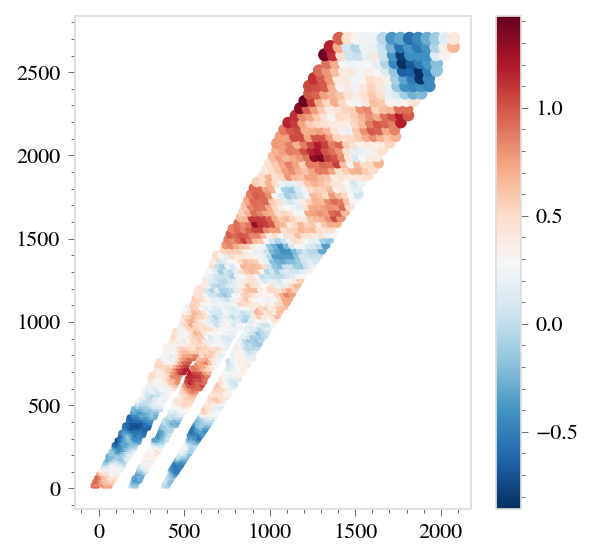

In [512]:
# auto-regressive history
ARH = np.zeros((n_cells, n_history))
cdata = np.zeros((n_cells, n_extrusion))

def iterate_autoregression(ARH, n_iter):
    for i in range(n_iter):
        res = np.matmul(A, ARH[cell_iter_index, hist_iter_index]) + np.matmul(B, np.random.standard_normal(n_cells))
        ARH = np.c_[res, ARH[:,:-1]]
    return ARH

ARH = iterate_autoregression(ARH, n_iter=2*n_history)

for i in range(n_extrusion):
    ARH = iterate_autoregression(ARH, n_iter=1)
    cdata[:,i] = ARH[:,0]
    
plt.scatter(cX, cZ, c=cdata[:,-1], s=1e-2*cres**2)
plt.colorbar()

In [513]:
cdata.shape

(2082, 14527)

In [514]:
n_baseline = len(baseline)
D = np.zeros((n_layers, n_baseline, len(time)))

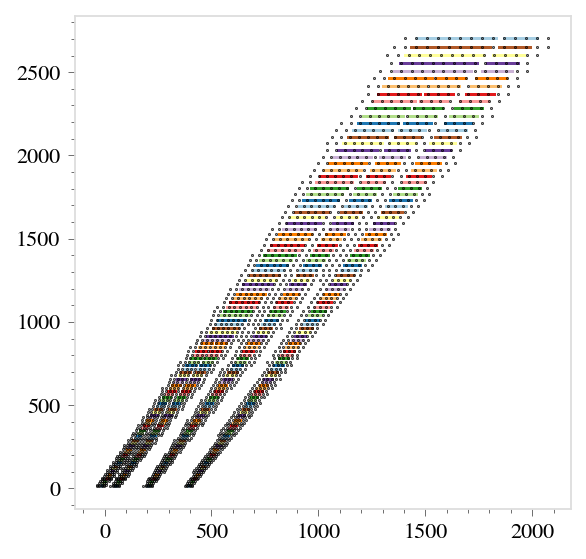

In [515]:
rot_baseline = np.matmul(sp.spatial.transform.Rotation.from_euler('z', wind_direction).as_matrix(), baseline.T)
baseline_X, baseline_Y = rot_baseline[:2]
for i_layer, h in enumerate(layer_heights):
    
    lm = layer_index == i_layer
    torx = h * np.sin(azim - wind_direction)/np.tan(elev)
    tory = h * np.cos(azim - wind_direction)/np.tan(elev) + wind_velocity * time
    torz = h * np.ones(len(azim))
    
    plt.scatter(baseline_X[:,None] + torx, 0 * baseline_Y[:,None] + torz, s=1e-1)
    
plt.scatter(cX, cZ, c='k', s=1e-1)

In [516]:
rot_baseline = np.matmul(sp.spatial.transform.Rotation.from_euler('z', wind_direction).as_matrix(), baseline.T)
baseline_X, baseline_Y = rot_baseline[:2]
for i_layer, h in enumerate(layer_heights):
    
    lm = layer_index == i_layer
    torx = h * np.sin(azim - wind_direction)/np.tan(elev)
    tory = h * np.cos(azim - wind_direction)/np.tan(elev) + wind_velocity * time
    torz = h * np.ones(len(azim))
    
    sample_X, sample_Y = baseline_X[:,None] + torx, baseline_Y[:,None] + tory

    D[i_layer] = sp.interpolate.RegularGridInterpolator((cX[lm], Y), 
                                                        cdata[lm])((sample_X, sample_Y))
    
    #if i_layer == 68: break
D.shape

(109, 4, 12000)

[]

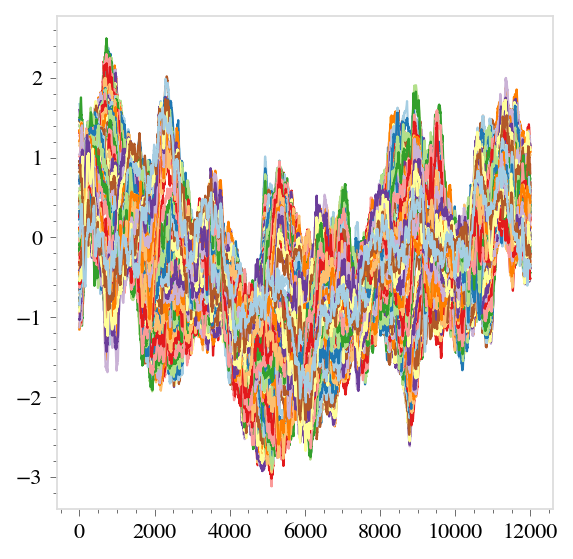

In [517]:
plt.plot(D[:,0].T)
plt.plot()

In [518]:
wv = (1 + 1e-1 * D[:,:,0])*np.exp(-layer_heights/1e3)[:,None]

In [519]:
timestep = dY / wind_velocity
timestep

0.1

/var/folders/8f/94fgpf0x5sv7zkd75r4sr50r0000gr/T/ipykernel_96036/2029476496.py:4: RuntimeWarning: divide by zero encountered in power
  plt.plot(f, f ** -(8/3))


[]

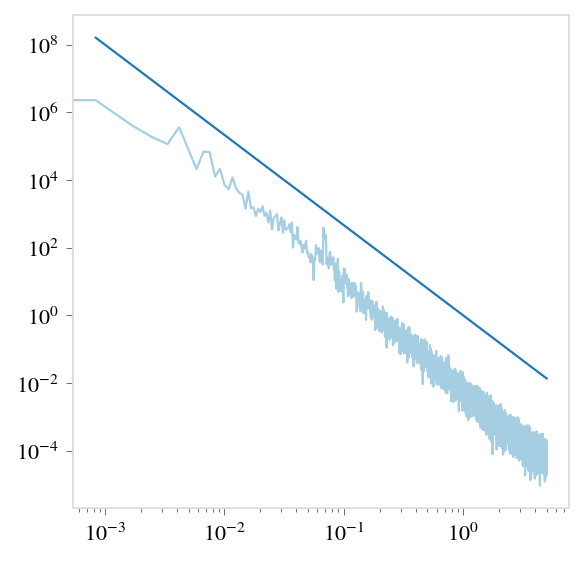

In [520]:
f, ps = sp.signal.periodogram(D.sum(axis=0), fs=1/timestep, window='tukey')

plt.plot(f, ps.mean(axis=0))
plt.plot(f, f ** -(8/3))
plt.loglog()

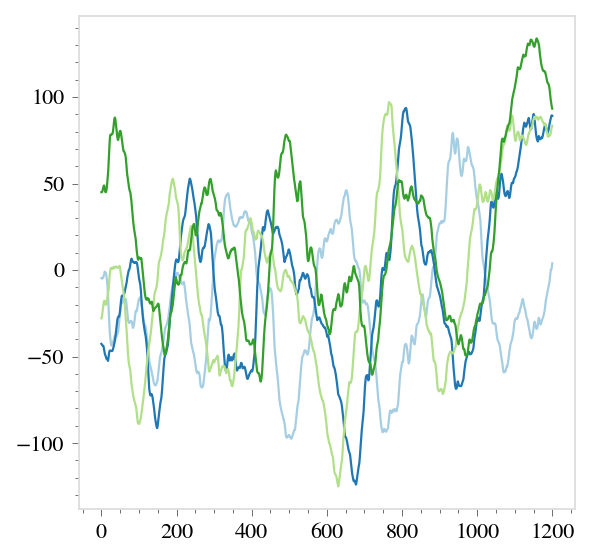

In [476]:
for d in D.sum(axis=0):
    plt.plot(time, d)
plt.show()

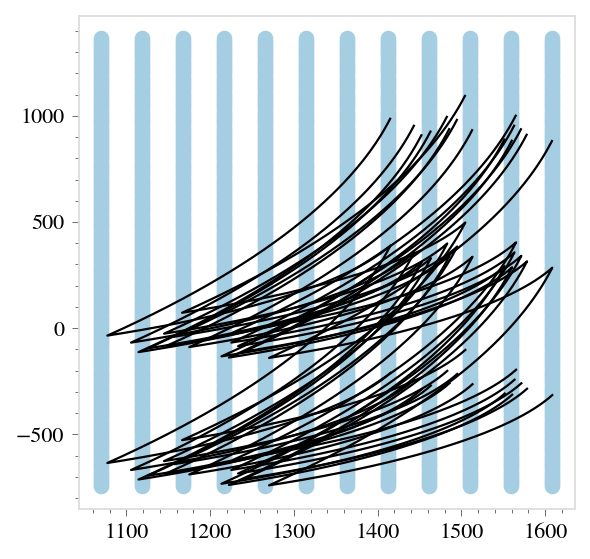

In [144]:
phi_ = azim - wind_direction

i_layer = 108

h = layer_heights[i_layer]
lm = layer_index == i_layer

torx, tory = h * np.sin(azim - wind_direction)/np.tan(elev), h * np.cos(azim - wind_direction)/np.tan(elev) + wind_velocity * time

plt.scatter(*np.meshgrid(cX[lm], Y))#, cdata[lm].T)

plt.plot(baseline_X + torx[:,None], baseline_Y + tory[:,None], c='k')
plt.show()

In [283]:
X = layer_heights[:,None] * np.sin(azim - wind_direction) / np.tan(elev)
Y = layer_heights[:,None] * np.cos(azim - wind_direction) / np.tan(elev) + wind_velocity * time

In [307]:
#plt.scatter(baseline_X, baseline_Y)

In [282]:
for i_h, h in enumerate(layer_heights):
    
    X = h * np.sin(azim - wind_direction) / np.tan(elev)
    Y = h * np.cos(azim - wind_direction) / np.tan(elev) + wind_velocity * time
    

In [289]:
cX.min(), cX.max()

(-282.842712474619, 1833.6225891803188)

In [288]:
X.min(), X.max()

(2.899477501528802, 1545.2851612699812)

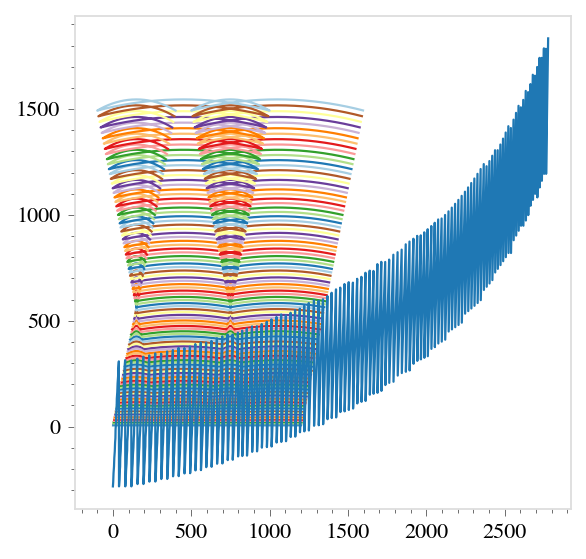

In [293]:
plt.plot(Y.T, X.T)
plt.plot(cX)
plt.show()

In [275]:
X = np.cos(azim - wind_direction)
Y = np.sin(azim - wind_direction) + wind_velocity * time


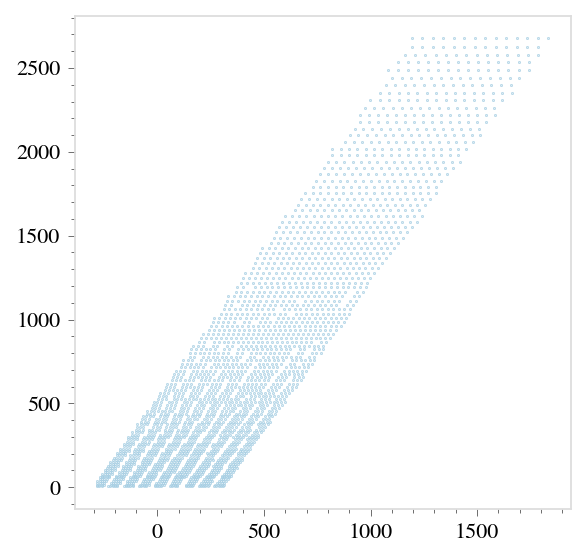

In [246]:
plt.scatter(cX, cZ, s=1e-1)

In [192]:
layer_index

array([  0,   0,   0, ..., 108, 108, 108])

In [224]:
TOpos = layer_height * np.c_[np.cos(azim)/np.tan(elev), np.sin(azim)/np.tan(elev)]
TOpos

array([[1338.25620575,  772.64258063],
       [1336.90565246,  774.97710035],
       [1335.55102672,  777.30925935],
       ...,
       [1334.19233266,  779.63905053],
       [1335.55102672,  777.30925935],
       [1336.90565246,  774.97710035]])

In [239]:
TOpos.T[::-1]

array([[ 772.64258063,  774.97710035,  777.30925935, ...,  779.63905053,
         777.30925935,  774.97710035],
       [1338.25620575, 1336.90565246, 1335.55102672, ..., 1334.19233266,
        1335.55102672, 1336.90565246]])

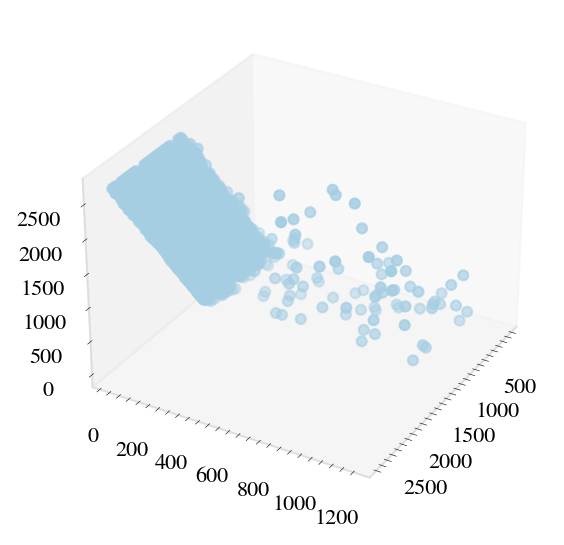

In [334]:
ax = plt.figure().add_subplot(projection='3d')

ax.scatter(cX[cell_iter_index], dY * hist_iter_index, cZ[cell_iter_index])
ax.view_init(azim=30)

CPU times: user 3.43 s, sys: 97.8 ms, total: 3.53 s
Wall time: 3.53 s


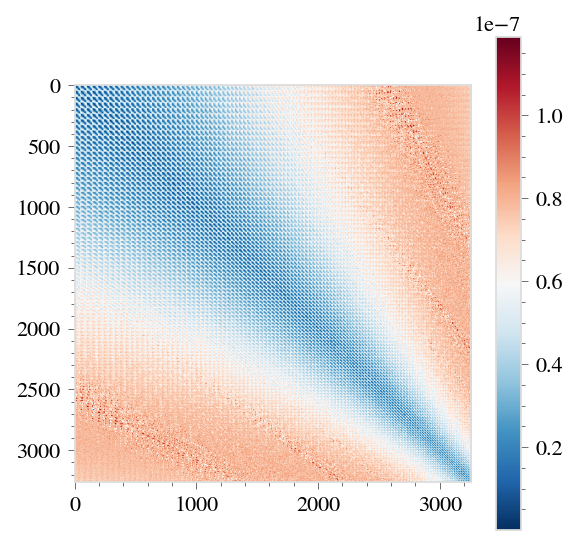

In [335]:

#%time error = _approximate_normalized_matern(Rii, r0=5000, nu=1/3, n_test_points=4096) -  normalized_matern(Rii, r0=5000, nu=1/3)

plt.imshow(np.abs(error))
plt.colorbar()

In [338]:
L, _ = sp.linalg.lapack.dpotrf(Cii)
res = np.matmul(L, np.random.standard_normal(cN))

In [342]:
eN, hN

(116, 116)

In [168]:
start_time = ttime.time()
for i in range(eN):
    res = np.matmul(A, hist_data[cell_iter_index, hist_iter_index]) + np.matmul(B, np.random.standard_normal(cN))
    hist_data = np.c_[res, hist_data[:,:-1]]
(ttime.time() - start_time) / eN

0.005837656300643395

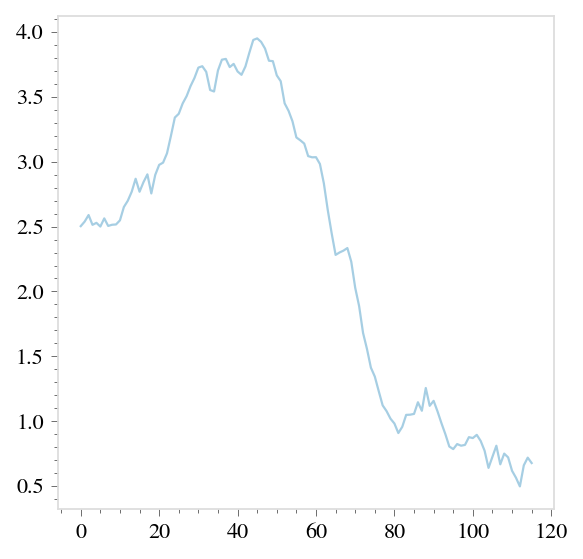

In [170]:
plt.plot(hist_data[0])

In [105]:
timestep

0.5042761794444605

In [106]:
speedup_factor = 10

duration_seconds = 5

frame_per_second = speedup_factor / timestep

n_frames = int(duration_seconds * frame_per_second)

duration_seconds, frame_per_second, n_frames

(5, 19.830403274286272, 99)

In [107]:
slabX, slabY = np.meshgrid(cX, dY * np.arange(eN), indexing='ij')
slabZ, _     = np.meshgrid(cZ, dY * np.arange(eN), indexing='ij')

In [108]:
slabZ

array([[   5.04940348,    5.04940348,    5.04940348, ...,    5.04940348,
           5.04940348,    5.04940348],
       [   5.04940348,    5.04940348,    5.04940348, ...,    5.04940348,
           5.04940348,    5.04940348],
       [   5.04940348,    5.04940348,    5.04940348, ...,    5.04940348,
           5.04940348,    5.04940348],
       ...,
       [2733.15556002, 2733.15556002, 2733.15556002, ..., 2733.15556002,
        2733.15556002, 2733.15556002],
       [2733.15556002, 2733.15556002, 2733.15556002, ..., 2733.15556002,
        2733.15556002, 2733.15556002],
       [2733.15556002, 2733.15556002, 2733.15556002, ..., 2733.15556002,
        2733.15556002, 2733.15556002]])

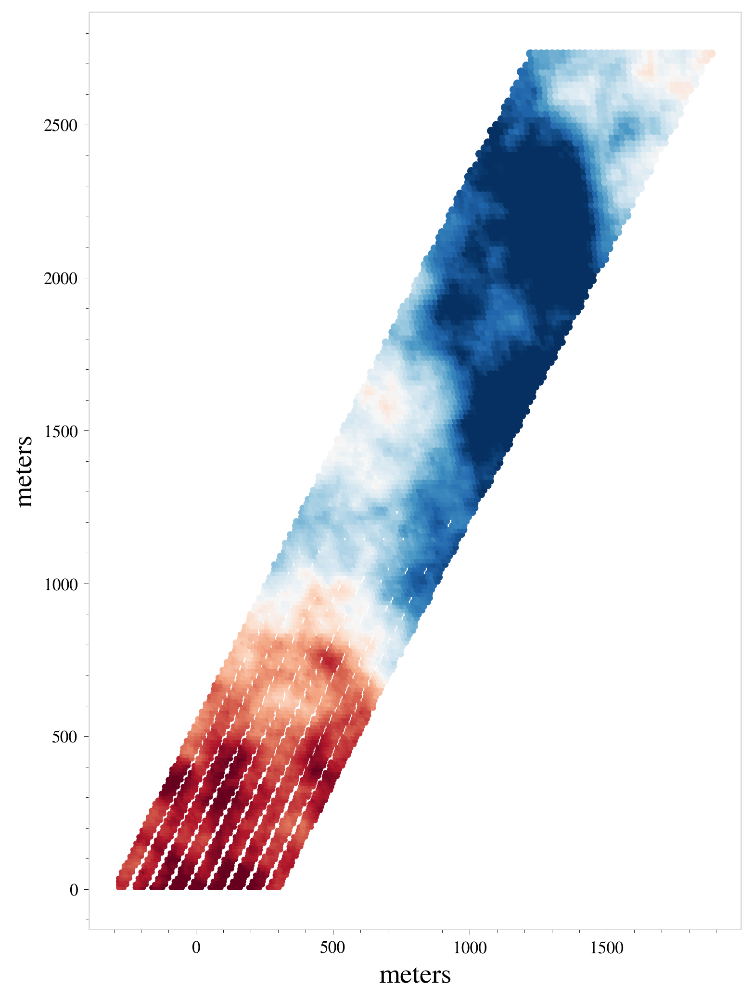

In [109]:
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation, writers
import numpy as np
import IPython as ip

fig = plt.figure(figsize=(6, 8), dpi=256, constrained_layout=True)
ax = fig.add_subplot()

ref = ax.scatter(cX, cZ, c=hist_data[:,0].ravel(), 
                 s=4e-2*eres.ravel()**2)

ax.set_xlabel('meters')
ax.set_ylabel('meters')

def animation_function(i):
    print(i)
    ip.display.clear_output(wait=True)
    global hist_data
    res = np.matmul(A, hist_data[cell_iter_index, hist_iter_index]) + np.matmul(B, np.random.standard_normal(cN))
    hist_data = np.c_[res, hist_data[:,:-1]]
    ref.set_array(hist_data[:,0])
  
animation = FuncAnimation(fig, animation_function, frames=n_frames, interval=1000/frame_per_second)
animation.save('maria_3d.mp4', dpi=256)

In [173]:
slabX, slabY = np.meshgrid(cX, dY * np.arange(eN), indexing='ij')
slabZ, _     = np.meshgrid(cZ, dY * np.arange(eN), indexing='ij')

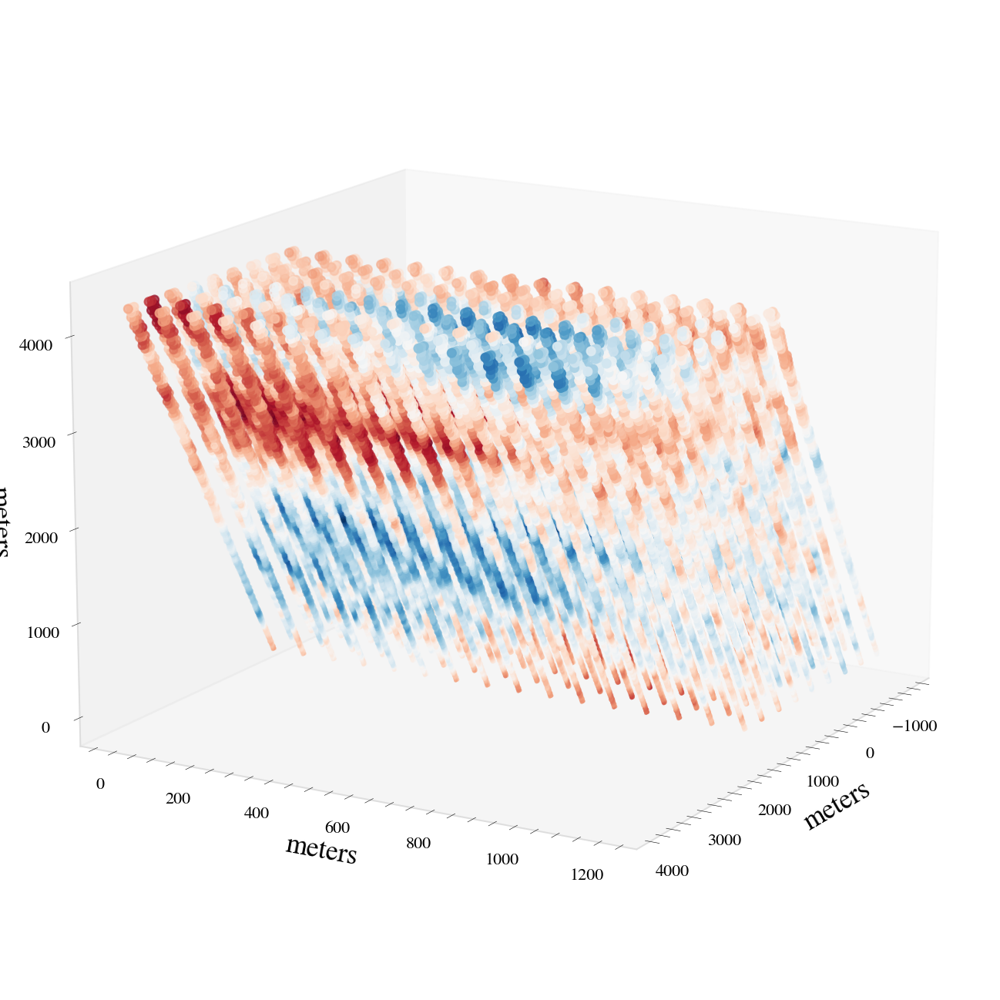

In [183]:
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation, writers
import numpy as np
import IPython as ip

fig = plt.figure(figsize=(12, 8), constrained_layout=True)

ax = fig.add_subplot(projection='3d')

dsr = 8
ref = ax.scatter(slabX[:,::dsr].ravel(), 
                 slabY[:,::dsr].ravel(), 
                 slabZ[:,::dsr].ravel(), 
                 c=hist_data[:,::dsr].ravel(), 
                 s=np.outer(eres, 1e-1*np.ones(eN)[::dsr]).ravel()**2)
ax.view_init(azim=30, elev=15)

ax.set_xlabel('meters')
ax.set_ylabel('meters')
ax.set_zlabel('meters')

def animation_function(i):
    print(i)
    ip.display.clear_output(wait=True)
    global hist_data
    res = np.matmul(A, hist_data[cell_iter_index, hist_iter_index]) + np.matmul(B, np.random.standard_normal(cN))
    hist_data = np.c_[res, hist_data[:,:-1]]
    ref.set_array(hist_data[:,::dsr].ravel())
    
T  = 5
fr = 3

frames = T * fr
  
animation = FuncAnimation(fig, animation_function, frames=frames, interval=1000/fr)
animation.save('maria_3d.mp4', dpi=256)

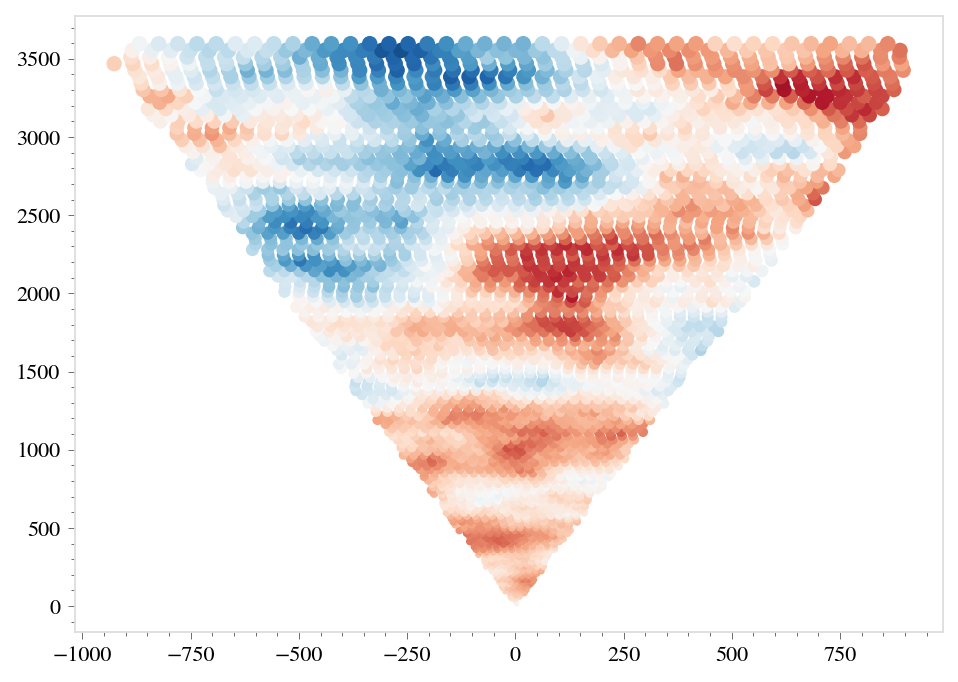

In [275]:
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation, writers
import numpy as np
  
fig, ax = plt.subplots(figsize=(7,5))

ref = ax.scatter(cX, cZ, c=hist_data[:,0], s=2e-2*np.square(cres))

def animation_function(i):
    global hist_data
    res = np.matmul(A, hist_data[cell_iter_index, hist_iter_index]) + np.matmul(B, np.random.standard_normal(cN))
    hist_data = np.c_[res, hist_data[:,:-1]]
    ref.set_array(res)
  
animation = FuncAnimation(fig, animation_function, frames=400, interval = 10)
animation.save('3d.mp4')



ValueError: 'c' argument has 526 elements, which is inconsistent with 'x' and 'y' with size 8195.

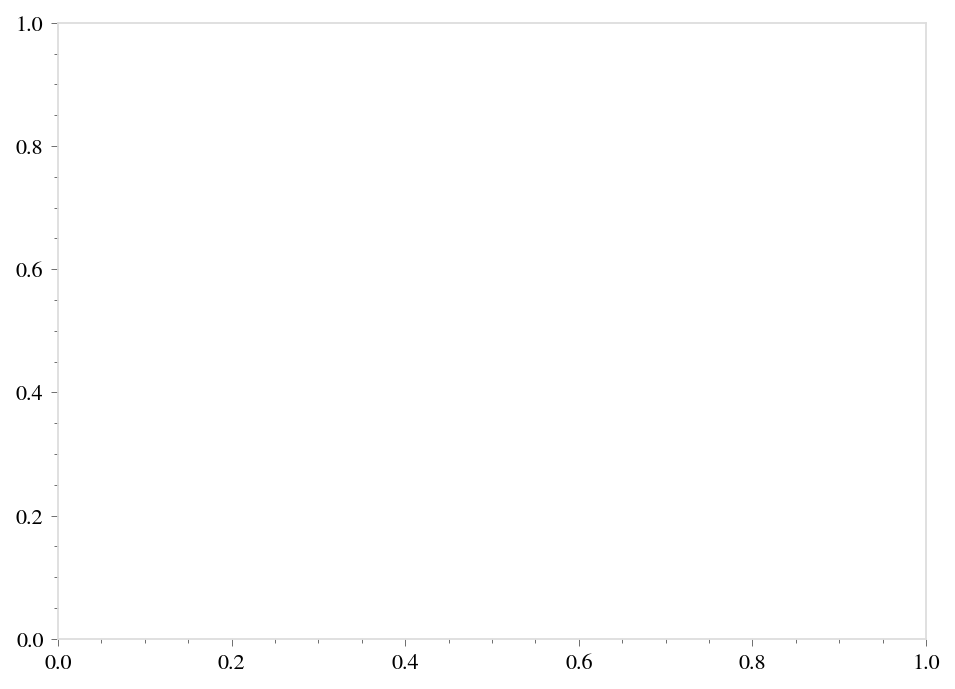

In [302]:
fig, ax = plt.subplots(figsize=(7,5))

ref = ax.scatter(cX, cZ, c=hist_data[:,0], s=2e-2*np.square(cres))

In [ ]:
msqrt  = lambda M : [np.matmul(u,np.diag(np.sqrt(s))) for u,s,vh in [np.linalg.svd(M)]][0]
L = msqrt(C + 1e-4 * np.eye(good.sum()))

In [400]:
def normalized_matern(r, r0, nu):

    nu    = 5/6
    d_eff = np.abs(r)/r0

    return 2**(1-nu)*sp.special.kv(nu, np.sqrt(2*nu)*d_eff+1e-6)*(np.sqrt(2*nu)*d_eff+1e-6)**nu/sp.special.gamma(nu)

def _approximate_normalized_matern(r, r0, nu, n_test_points=1024):
    
    _r = np.atleast_1d(np.abs(r))
    
    r_min = np.minimum(1e-6*r0, _r[_r>0].min())
    r_max = np.maximum(1e02*r0, _r.max())
    
    rrel = np.cumsum(np.linspace(0, 1, n_test_points) ** 4)
    r_test = rrel * (r_max - r_min) / rrel.max() + r_min

    return np.exp(np.interp(np.abs(r), r_test, np.log(normalized_matern(r_test, r0, 1/3))))

0.0005 50000.0
50000.0
[]


[]

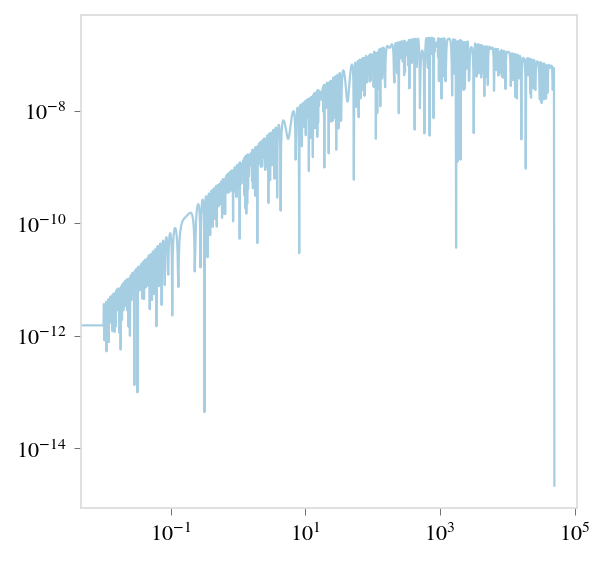

In [401]:
outer_scale = 500

r = np.r_[0, np.geomspace(1e-2, 1e2 * outer_scale, 1024)]

true = normalized_matern(r, outer_scale, nu=1/3)
pred = _approximate_normalized_matern(r, outer_scale, nu=1/3, n_test_points=4096)

plt.plot(r, np.abs((true - pred) / true))
plt.loglog()

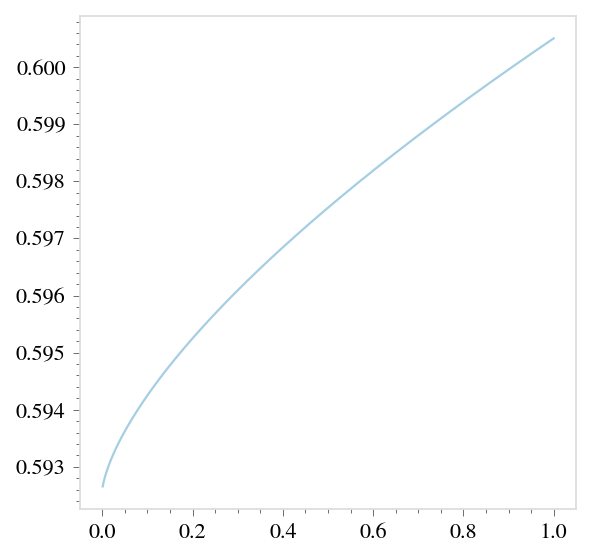

In [244]:
r = np.geomspace(1e-3, 1e0, 1024)

d_eff = np.sqrt(2*1/3)* r / outer_scale + 1e-6

plt.plot(r, 1/(d_eff ** (1/3) * sp.special.kv(1/3, d_eff)))

In [376]:
def matern(r, a, r0):

    nu     = 5/6
    d_eff  = np.abs(r) / r0

    return a**2*2**(1-nu)*sp.special.kv(nu, np.sqrt(2*nu)*d_eff+1e-9)*(np.sqrt(2*nu)*d_eff+1e-9)**nu/sp.special.gamma(nu)

def _matern_sf(r, a, r0):

    return 2 * a**2 * (1 - _matern_cov(r, 1, r0))

def _log_matern_sf(r, a, r0):

    return np.log(_matern_sf(r, a, r0))

In [373]:
R

array([[  -15.89420114,   -26.03504621,   -36.26978799, ...,
        -3572.8895063 , -3572.8895063 , -3572.8895063 ],
       [  -17.25570349,   -27.39654856,   -37.63129034, ...,
        -3574.25100865, -3574.25100865, -3574.25100865],
       [  -18.80499926,   -28.94584433,   -39.18058612, ...,
        -3575.80030443, -3575.80030443, -3575.80030443],
       ...,
       [  823.87105708,   813.73021201,   803.49547022, ...,
        -2733.12424809, -2733.12424809, -2733.12424809],
       [  851.52363924,   841.38279417,   831.14805238, ...,
        -2705.47166593, -2705.47166593, -2705.47166593],
       [  879.1762214 ,   869.03537633,   858.80063454, ...,
        -2677.81908377, -2677.81908377, -2677.81908377]])

In [197]:
np.c_[X, Z].shape

(13940, 2)

In [188]:
np.unsqueeze

AttributeError: module 'numpy' has no attribute 'unsqueeze'

In [ ]:
def point_in_hull(point, hull, tolerance=1e-12):
    return all(
        (np.dot(eq[:-1], point) + eq[-1] <= tolerance)
        for eq in hull.equations)

In [ ]:
from scipy.spatial import Delaunay
if not isinstance(hull,Delaunay):
    hull = Delaunay(hull)

return hull.find_simplex(p)>=0

In [174]:
X.shape

(164, 85)

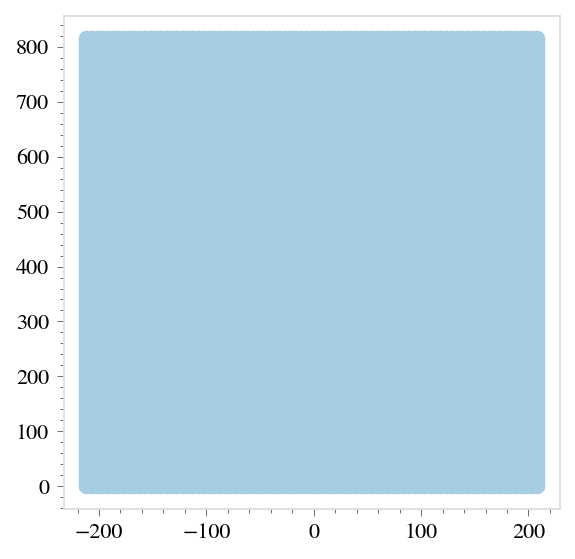

In [176]:
plt.scatter(X, Z)

In [118]:
[np.sin(elev).min(), np.sin(elev).max()]

[0.573576436351046, 0.8191520442889917]

In [123]:
plt.scatter(X*Y*D)

TypeError: scatter() missing 1 required positional argument: 'y'

In [116]:
np.cos(azim).min(), np.cos(azim).max()

(0.5000000000000001, 0.8660254037844386)

In [117]:
X

array([[[0.5      , 0.5      ],
        [0.5      , 0.5      ]],

       [[0.8660254, 0.8660254],
        [0.8660254, 0.8660254]]])

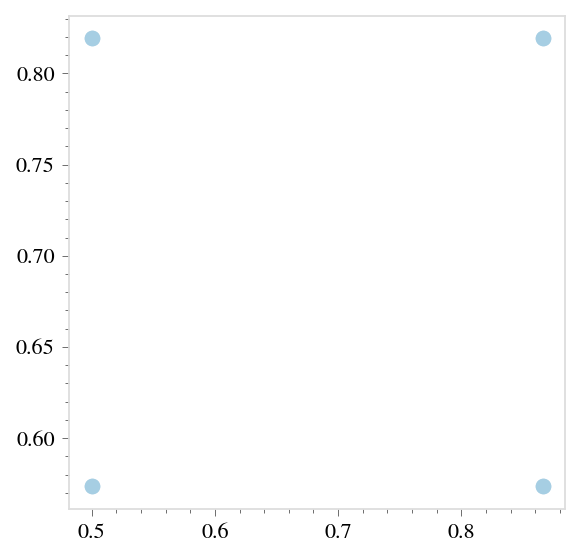

In [111]:
plt.scatter(X, Y)

In [63]:
X.shape

(12000, 2)

In [43]:
#plt.plot(x)

In [27]:
Z, A, E = np.meshgrid()

array([   0., 1000.])

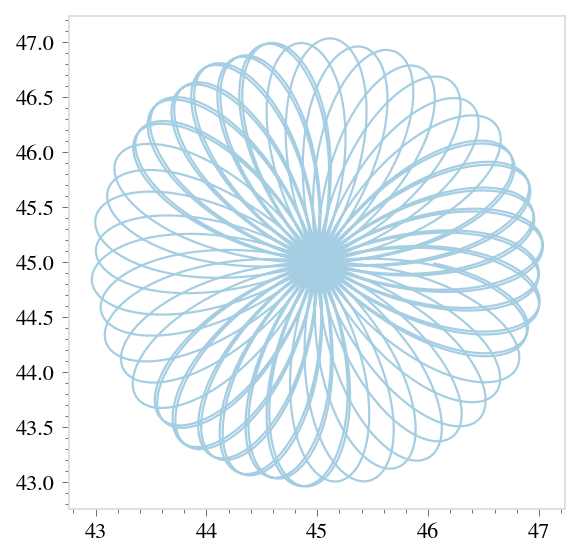

In [19]:
plt.plot(azim, elev)

In [ ]:
res = 10 # meters



In [80]:
x = 'the number 3'



f'{x:<06f}'

ValueError: Unknown format code 'f' for object of type 'str'

In [73]:
AtLAST_config = {           'site' : 'chajnantor',
                           'bands' : [(27e9, 10e9, 50),   # (band center, bandwidth, dets per band) [GHz, GHz, .]
                                      (39e9, 10e9, 50), 
                                      (93e9, 10e9, 50), 
                                      (145e9, 10e9, 50), 
                                      (225e9, 10e9, 50), 
                                      (280e9, 10e9, 50)],     
                        'geometry' : 'hex',               # [.]   type of detector distribution
                   'field_of_view' : 0.5,                 # [deg] maximum det separation
                    'primary_size' : 50,                  # [m]   size of the primary mirror
                   'band_grouping' : 'randomized',        # [.]   type of band distribution
                       'az_bounds' : [0, 360],            # [.]   type of band distribution
                       'el_bounds' : [30, 90],
                      'max_az_vel' : 3,            
                      'max_el_vel' : 2,
                      'max_az_acc' : 1,
                      'max_el_acc' : 0.25,
                }

static_config = { 'coord_throw' : (2, 0),
                 'scan_options' : {'k' : 3.1416}, # 
                 'scan_pattern' : 'daisy',
                  'scan_period' : 120,        # [s]   how often the scan pattern repeats
                  'sample_rate' : 20,        # [Hz]  how fast to sample
              }

from maria.utils import Planner 

AtLAST  = maria.Array(AtLAST_config)

planner = Planner(AtLAST)
plan_configs = planner.make_plans(start='2023-08-01', 
                                  end='2023-08-02', 
                                  ra=45, 
                                  dec=-9, 
                                  chunk_time=600,
                                  static_config=static_config)

plan_config_list = list(plan_configs)

plan = maria.Plan(plan_config_list[0])

In [74]:
lam = maria.LAM(AtLAST, plan, verbose=True) 

Computing weights: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 188.61it/s]


 # | depth (m) | beam (m) | beam (') | sim (m) | sim (') | rms (mg/m2) | n_cov | orth | para | h2o (g/m3) | temp (K) | ws (m/s) | wb (deg) |
 1 |     500.0 |    50.00 |   343.77 |    6.25 |   42.97 |      901.39 |    66 |   21 |  576 |        0.47 |   266.83 |     9.60 |   285.88 |
 2 |    2750.0 |    50.00 |    62.50 |    6.25 |    7.81 |      385.99 |    66 |   21 |  901 |        0.21 |   258.82 |    16.11 |   280.10 |
 3 |    5000.0 |    50.00 |    34.38 |    6.25 |    4.30 |      195.91 |    72 |   23 | 1120 |        0.11 |   250.63 |    20.40 |   278.00 |


In [75]:
lam.simulate_atmosphere()

Integrating spectra: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 13.57it/s]


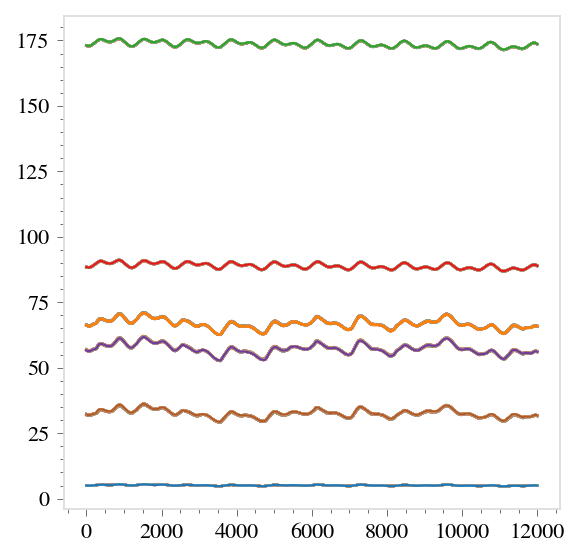

In [76]:
plt.plot(lam.atm_power.T)
plt.show()

(Text(0.5, 0, 'ra (deg)'), Text(0, 0.5, 'dec (deg)'))

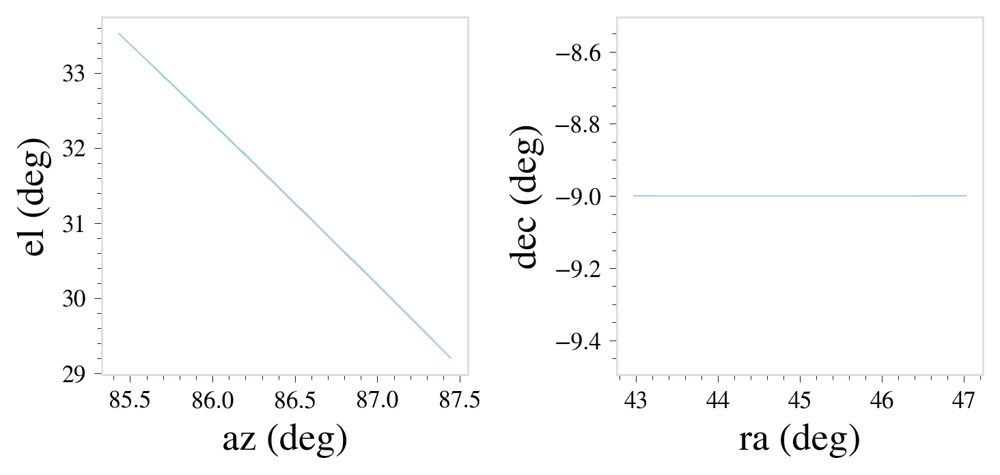

In [77]:
fig, axes = plt.subplots(1,2,figsize=(6,3),dpi=256, tight_layout=True)

axes[0].plot(np.degrees(lam.c_az), np.degrees(lam.c_el), lw=5e-1)
axes[0].set_xlabel('az (deg)'), axes[0].set_ylabel('el (deg)')

axes[1].plot(np.degrees(lam.c_ra), np.degrees(lam.c_dec), lw=5e-1)
axes[1].set_xlabel('ra (deg)'), axes[1].set_ylabel('dec (deg)')

In [30]:
f, ps = sp.signal.periodogram(lam.atm_power, fs=lam.plan.sample_rate, window='tukey')

[]

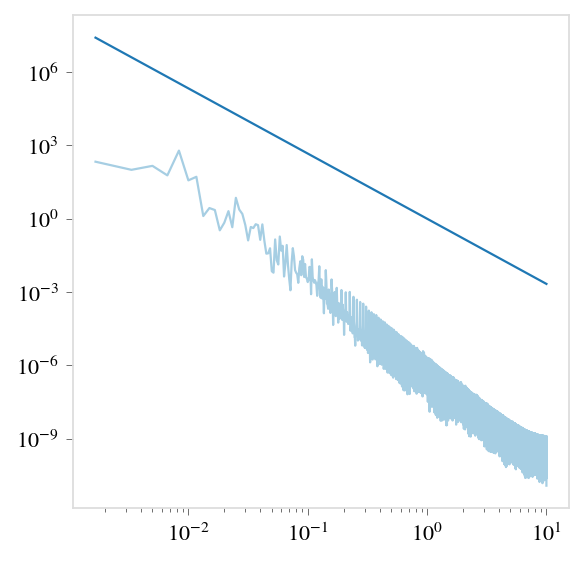

In [31]:
plt.plot(f[1:], ps.mean(axis=0)[1:])
plt.plot(f[1:], f[1:] ** (-8/3))
plt.loglog()

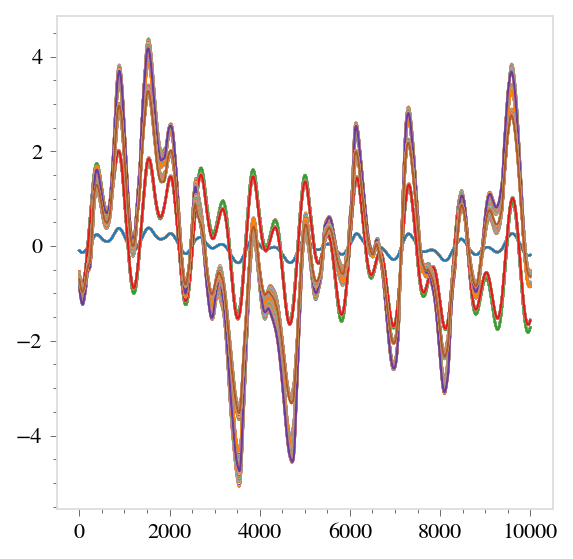

In [78]:
d = lam.atm_power[:,:10000]

d -= d.mean(axis=1)[:,None]

plt.plot(d.T)
plt.show()

In [37]:
plt.plot(lam.az)

AttributeError: 'LAM' object has no attribute 'az'

In [34]:
lam.thicks

array([2250., 2250., 2250.])

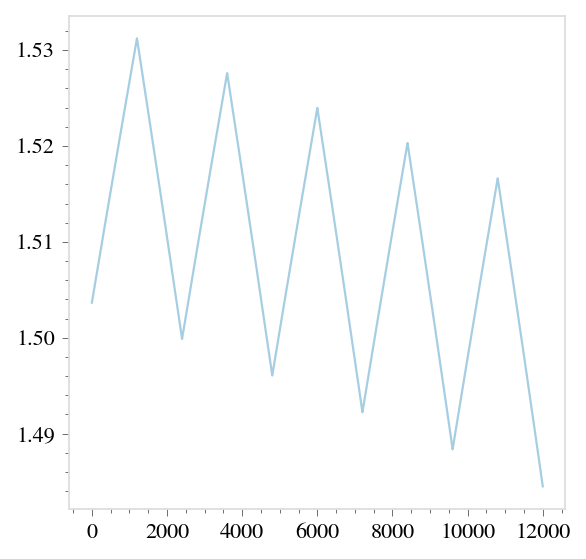

In [39]:
plt.plot(lam.c_az)

In [22]:
#plt.scatter(array.x, array.y, s=1)

In [23]:
coordinator = maria.tools.coordinator(lon=-67.5, lat=-90)


t0 = datetime(2022,6,1).timestamp()
t1 = datetime(2022,6,18).timestamp()

t = np.arange(t0,t1,600)

ra, dec = coordinator.transform(t, [[np.pi/2]], [[-np.pi/4]], in_frame='galactic', out_frame='icrs')
az, el  = coordinator.transform(t[None], np.repeat(0.,len(t))[None], np.repeat(np.pi/4,len(t))[None], in_frame='icrs', out_frame='az_el')

AttributeError: 'list' object has no attribute 'shape'

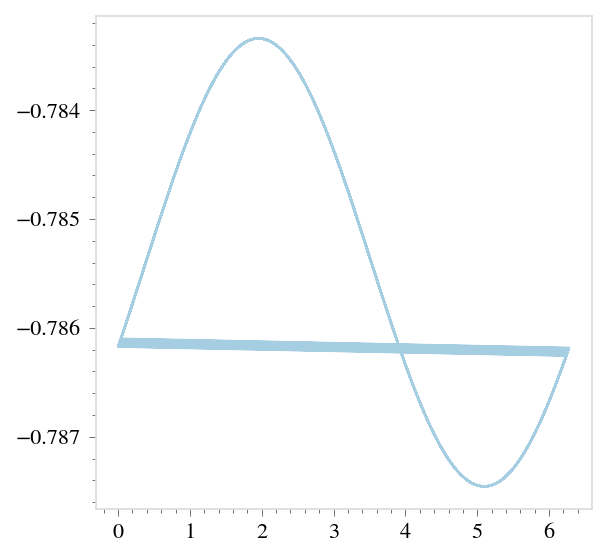

In [119]:
plt.plot(az[0], el[0])

In [70]:
np.reshape(5,(-1,1))

array([[5]])

In [58]:
coordinator.R

array([[-0.44482972,  0.49410944,  0.74698218],
       [-0.87343705, -0.05487566, -0.48383507],
       [-0.19807634, -0.86766614,  0.45598381]])

In [45]:
az, el

(array([[4.33721371]]), array([[1.25215978]]))

In [17]:
#12 *  

test_ra  = 12.857
test_dec = 

12 + 51.4 / 60

12.856666666666667

In [9]:
array = maria.array({  'band_centers' : [27e9, 39e9, 93e9, 145e9, 225e9, 280e9],     # [Hz]  band centers
                        'band_widths' : [5e9, 5e9, 10e9, 10e9, 30e9, 40e9],
                      'dets_per_band' : [500, 1000, 2000, 4000, 2000, 1000],
                           'geometry' : 'hex',      # [.]   type of detector distribution
                      'field_of_view' : 0.5,        # [deg] maximum det separation
                       'primary_size' : 50,         # [m]   size of the primary mirror
                      'band_grouping' : 'random', 
})

obs = maria.plan({       'site' : 'chajnantor', 
                   'start_time' : '2022-07-01T08:00:00',
                     'end_time' : '2022-07-01T09:00:00',
                 'scan_pattern' : 'daisy',      # [.]   the type of scan strategy (SS)
                 'plan_options' : {'k' : 4}, # 
                 'coord_center' : (45, 45),
                  'coord_throw' : (5, 5),
                  'coord_frame' : 'ra_dec',
                  'scan_period' : 60,        # [s]   how often the scan pattern repeats
                  'sample_rate' : 20,        # [Hz]  how fast to sample
        })

In [10]:
np.where(site.weather['pwv']<5e2)[0][0]

27

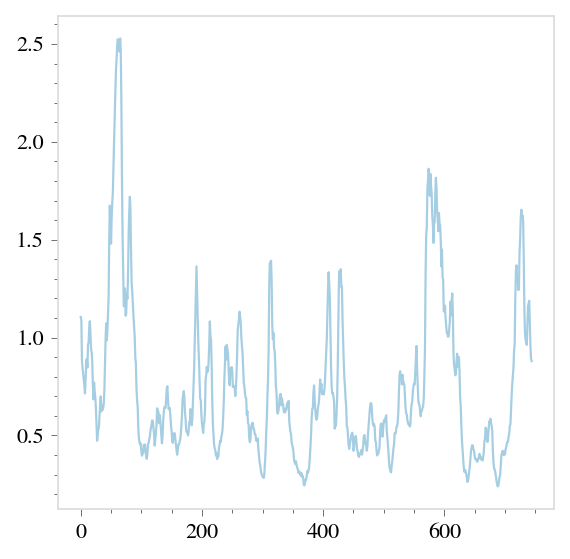

In [11]:
plt.plot(1e-3*site.weather['pwv'][:1000])

In [107]:
plan = maria.plan({'start_time' : '2022-07-01T08:00:00',
                     'end_time' : '2022-07-01T09:00:00',
                    'plan_type' : 'rose',    # [.]   the type of scan strategy (SS)
                 'plan_options' : {'k' : 4}, # 
                  'scan_period' : 60,        # [s]   how often the SS should repeat
                  'sample_rate' : 20,        # [Hz]  how fast to sample
                    'az_center' : 45,        # [deg] the azimuth of the center of the scan
                    'el_center' : 45,        # [deg] the elevation of the center of the scan
                     'az_throw' : 5,         # [deg] how far the azimuth goes in either direction
                     'el_throw' : 5,         # [deg] how far the elevation goes in either direction
        })

In [87]:
#plt.plot(np.gradient(np.gradient(np.degrees(plan.c_azim))/np.gradient(plan.time))/np.gradient(plan.time))

In [ ]:
# tracking in scan pattern
# 
#
#

In [ ]:
#  
# green_bank scanning patterns 

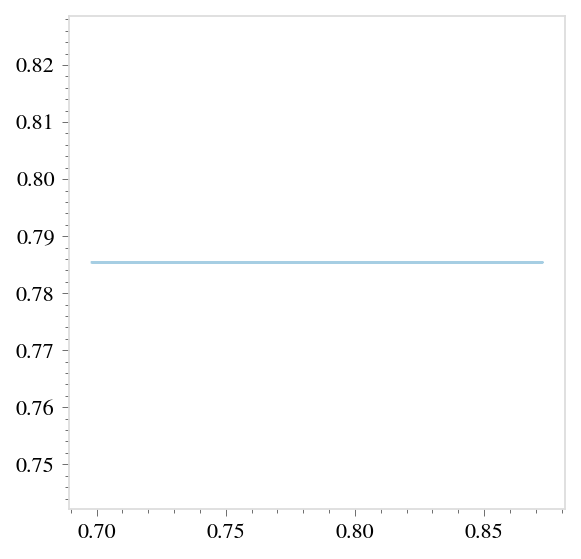

In [102]:
plt.plot(plan.c_azim, plan.c_elev)

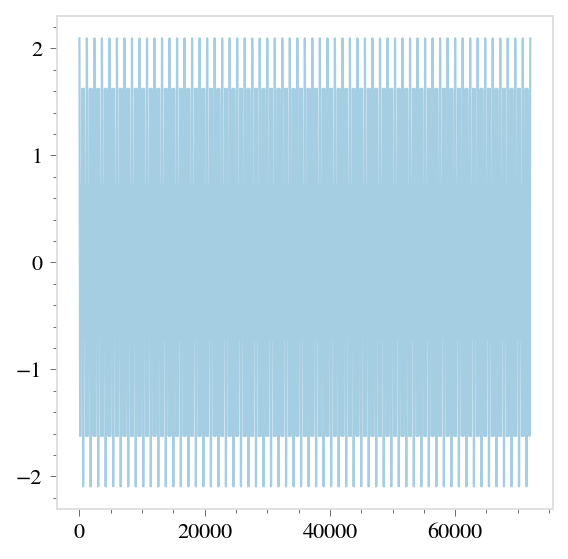

In [86]:
plt.plot(np.gradient(np.degrees(plan.c_azim))/np.gradient(plan.time))

In [ ]:
# 1 deg / s^2 or less
# 3 deg / s or less 

In [ ]:
# create a model using maria's linear angular model (LAM)

lam.put({'min_depth' : 500,   # [m] the height of the lowest layer of atmosphere
         'max_depth' : 2000,  # [m] the height of the highest layer of atmosphere
          'n_layers' : 4,     # [.] how many layers of atmosphere to simulate 
      'min_beam_res' : 2,     # [.] the resolution of the simulated atmosphere, in multiples of the FWHM for each layer 
})

%time lam.initialize(verbose=True)

In [ ]:

fig, ax = plt.subplots(1,1,figsize=(6,6), dpi=160)

for ib, b in enumerate(array.ubands):

    bm = array.bands == b

    ax.scatter(np.degrees(array.x[bm]), 
               np.degrees(array.y[bm]), c=HEX_list[ib], label=f'{int(1e-9*b)}GHz', s=1e-1)

ax.legend(ncol=2)
ax.set_xlabel('(deg)')
ax.set_ylabel('(deg)')


In [115]:
datetime.now().isoformat()

'2022-09-17T21:16:09.299161'

In [59]:
%time lam.simulate_atmosphere(verbose=True)


Generating layers: 100%|███████████████| 18615/18615 [00:01<00:00, 15636.33it/s]

Sampling layers: 100%|████████████████████████████| 4/4 [01:00<00:00, 15.09s/it]

Integrating spectra: 100%|████████████████████████| 6/6 [00:10<00:00,  1.70s/it]

CPU times: user 42.8 s, sys: 25 s, total: 1min 7s
Wall time: 1min 12s


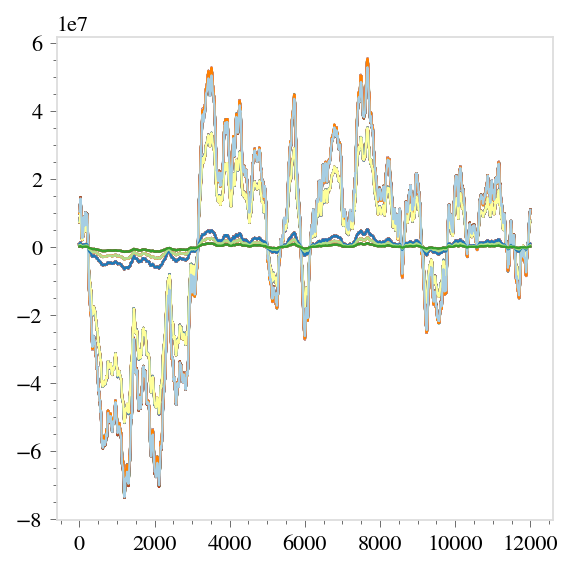

In [63]:
sub_data = lam.atm_power_data[:256]
sub_data -= sub_data.mean(axis=-1)[:,None]

plt.plot(1e7*sub_data.T)
plt.show()

In [67]:
# 15 by 15 degree patch
#
# 5 by 5 patch
# -30 dec

In [473]:
map_filepaths = glob.glob('/users/tom/desktop/datasets/cmb/maps/*')
cmb = hp.fitsfunc.read_map(map_filepaths[0])

In [474]:
hp.pixelfunc.ang2pix

<function healpy.pixelfunc.ang2pix(nside, theta, phi, nest=False, lonlat=False)>

In [475]:
pix = hp.pixelfunc.ang2pix(2048, np.pi/2 - lam.dec, lam.ra)

In [476]:
cmb_data = hp.get_interp_val(cmb, np.pi/2 - lam.b, lam.l)

In [477]:
lam.epwv.max()

AttributeError: 'LAM' object has no attribute 'epwv'

In [478]:
%time lam.simulate_atmosphere()

Integrating spectra: 100%|████████████████████████| 1/1 [00:01<00:00,  1.07s/it]

CPU times: user 3.68 s, sys: 80.2 ms, total: 3.76 s
Wall time: 3.75 s


Text(0, 0.5, 'T (pW)')

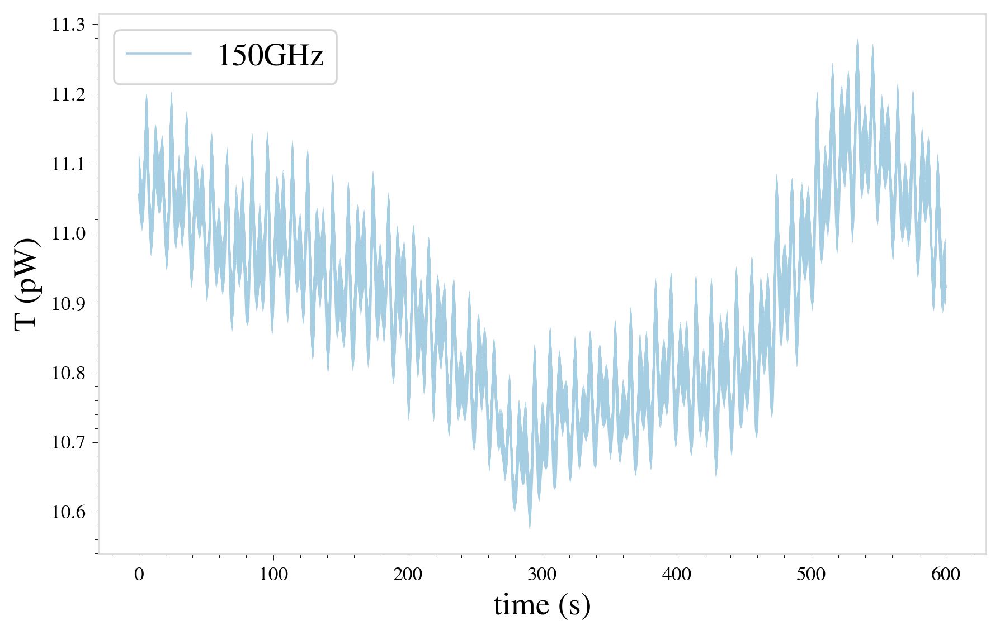

In [480]:

fig, ax = plt.subplots(1,1,figsize=(8,5), dpi=256)

nt = 12000
nt = len(lam.plan.time)

D  = lam.atm_power_data[:,:nt].copy()
#D -= D.mean(axis=1)[:,None]

for ib, b in enumerate(lam.array.ubands):

    bm = lam.array.bands == b

    for d in D[bm]:

        ax.plot(lam.plan.time[:nt], d, c=HEX_list[ib], lw=1e-1)

    ax.plot(lam.plan.time[:nt], d, c=HEX_list[ib], label=f'{int(1e-9*b)}GHz')

ax.legend(ncol=2)
ax.set_xlabel('time (s)')
ax.set_ylabel('T (pW)')


In [481]:
from astropy.io import fits
hdul = fits.open('maps/tsz.fits')

TRJ = -5.37 * 1e7 * hdul[0].data
map_res = np.radians(1/3600)

map_nx, map_ny = TRJ.shape

map_x = map_res * map_nx * np.linspace(-0.5, 0.5, map_nx)
map_y = map_res * map_ny * np.linspace(-0.5, 0.5, map_ny)

map_X, map_Y = np.meshgrid(map_x, map_y, indexing='ij')
map_L, map_B = tools.from_xy(map_X, map_Y, lam.l.mean(), lam.b.mean())

map_TRJ = np.zeros(hp.pixelfunc.nside2npix(2048))
map_TRJ[hp.pixelfunc.ang2pix(2048, np.pi/2 - map_L, map_B)] = TRJ

In [482]:
map_data = sp.interpolate.RegularGridInterpolator((map_x, map_y), TRJ, bounds_error=False, fill_value=0)((lam_x, lam_y))

In [483]:
x_bins = np.arange(map_X.min(), map_X.max(), 8 * map_res)
y_bins = np.arange(map_Y.min(), map_Y.max(), 8 * map_res)

x_mids = .5 * (x_bins[1:] + x_bins[:-1])
y_mids = .5 * (y_bins[1:] + y_bins[:-1])

In [484]:
true_map = sp.stats.binned_statistic_2d(map_X.ravel(), 
                          map_Y.ravel(),
                          TRJ.ravel(),
                          statistic='mean',
                          bins=(x_bins, y_bins))[0]

In [485]:
lam_x, lam_y = tools.to_xy(lam.l, lam.b, lam.l.mean(), lam.b.mean())
b_map = sp.stats.binned_statistic_2d(lam_x.ravel(), 
                          lam_y.ravel(),
                          map_data.ravel(),
                          statistic='mean',
                          bins=(x_bins, y_bins))[0]

In [488]:
lam_x, lam_y = tools.to_xy(lam.l, lam.b, lam.l.mean(), lam.b.mean())
total_map = sp.stats.binned_statistic_2d(lam_x.ravel(), 
                          lam_y.ravel(),
                          (map_data + lam.atm_power_data).ravel(),
                          statistic='mean',
                          bins=(x_bins, y_bins))[0]

/var/folders/8f/94fgpf0x5sv7zkd75r4sr50r0000gr/T/ipykernel_14139/2732072804.py:4: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(true_plt, ax=true_ax, location='bottom', shrink=0.8)
/var/folders/8f/94fgpf0x5sv7zkd75r4sr50r0000gr/T/ipykernel_14139/2732072804.py:7: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(signal_plt, ax=signal_ax, location='bottom', shrink=0.8)
/var/folders/8f/94fgpf0x5sv7zkd75r4sr50r0000gr/T/ipykernel_14139/2732072804.py:10: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(total_plt, ax=total_ax, location='bottom', shrink=0.

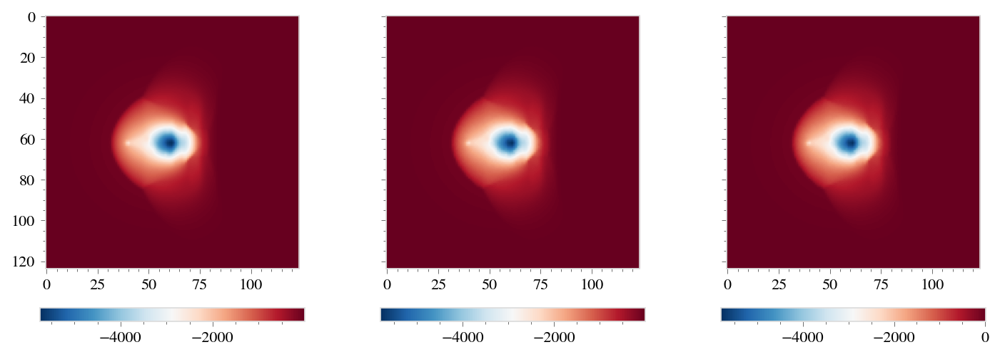

In [489]:
fig, (true_ax, signal_ax, total_ax) = plt.subplots(1,3,figsize=(9,3),sharex=True, sharey=True, constrained_layout=True)

true_plt = true_ax.imshow(true_map)
fig.colorbar(true_plt, ax=true_ax, location='bottom', shrink=0.8)

signal_plt = signal_ax.imshow(b_map)
fig.colorbar(signal_plt, ax=signal_ax, location='bottom', shrink=0.8)

total_plt = total_ax.imshow(total_map)
fig.colorbar(total_plt, ax=total_ax, location='bottom', shrink=0.8)

#for ax in 

In [466]:
map_data = hp.get_interp_val(map_TRJ, np.pi/2 - lam.l, lam.b)

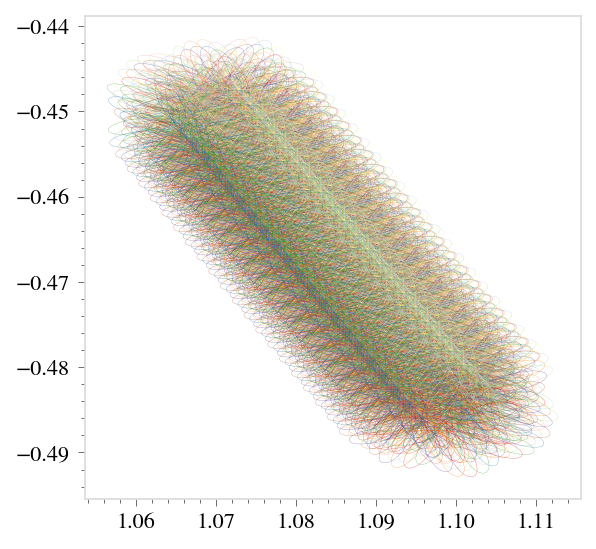

In [467]:
dsr = 4
plt.scatter(map_L[::dsr,::dsr], map_B[::dsr,::dsr], c=TRJ[::dsr,::dsr])
plt.plot(lam.l[::dsr,::dsr].T, lam.b[::dsr,::dsr].T, lw=1e-1)
plt.show()

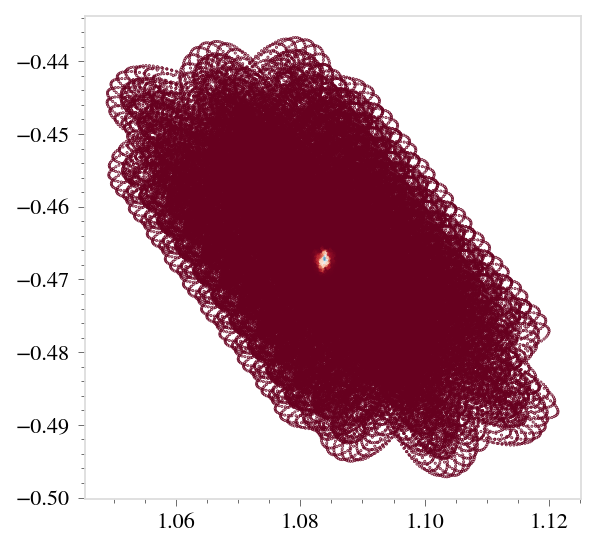

In [316]:
dsr = 8

plt.scatter(lam.l[::dsr,::dsr], lam.b[::dsr,::dsr], c=map_data[::dsr,::dsr], s=1e-1)

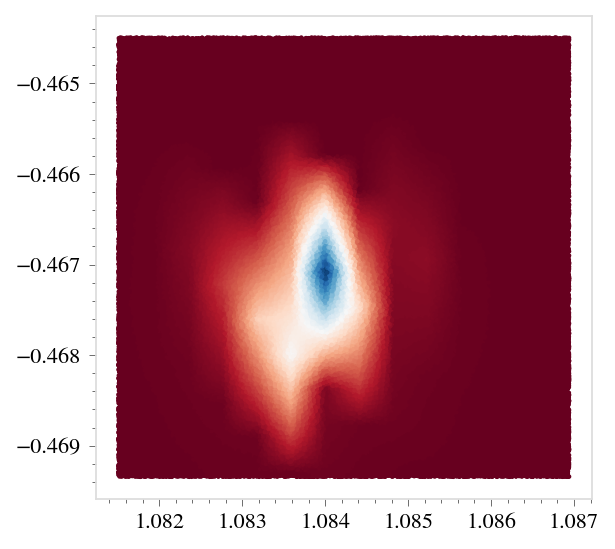

In [317]:
in_map = (lam.l > map_L.min()) & (lam.l < map_L.max()) & (lam.b > map_B.min()) & (lam.b < map_B.max())

plt.scatter(lam.l[in_map], lam.b[in_map], c=map_data[in_map], s=1)

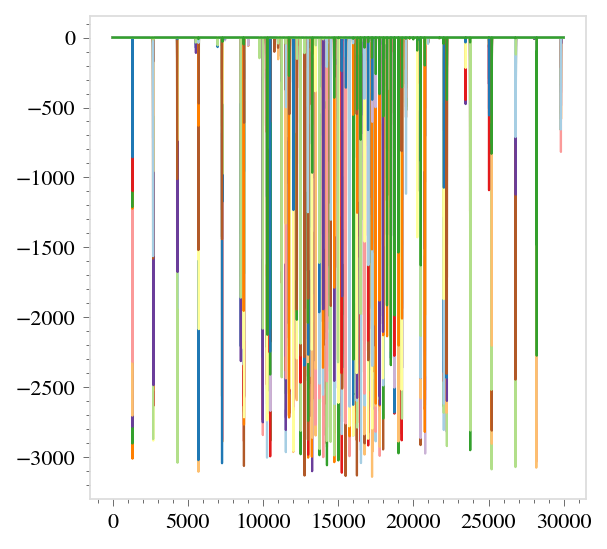

In [211]:
plt.plot(map_data.T)
plt.show()

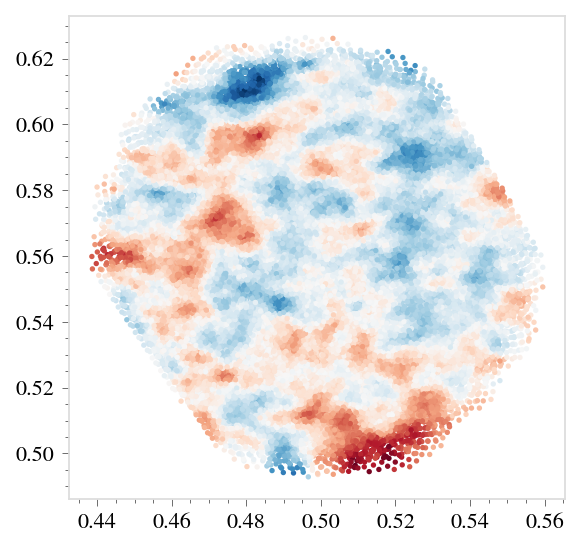

In [80]:
plt.scatter(lam.l[:,::16], lam.b[:,::16], c=cmb_data[:,::16], s=2)

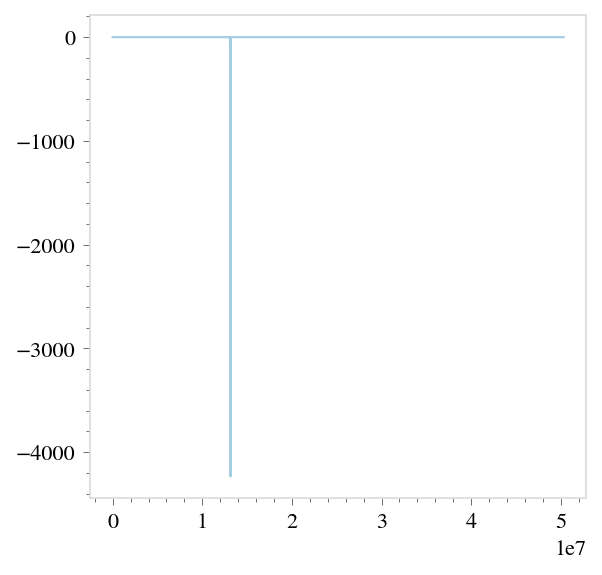

In [113]:
plt.plot(map_TRJ)

In [65]:
far_field_angular_waist = 2 * model.array.get_beam_waist(w_0=0.5*model.array.primary_size, z=1e16, f=1.5e11) / 1e16

0.25 * far_field_angular_waist

0.0001272390718372006

In [66]:
binned_map_res = far_field_angular_waist / 4

ra_mids  = np.arange(model.ra.min() - binned_map_res, model.ra.max() + binned_map_res, binned_map_res)
dec_mids = np.arange(model.dec.min() - binned_map_res, model.dec.max() + binned_map_res, binned_map_res)

ra_bins  = np.array([*ra_mids - 0.5 * binned_map_res, ra_mids[-1] + 0.5 * binned_map_res])
dec_bins = np.array([*dec_mids - 0.5 * binned_map_res, dec_mids[-1] + 0.5 * binned_map_res])

binned_map_TRJ = sp.stats.binned_statistic_2d(map_RA.ravel(), map_DEC.ravel(), map_TRJ.ravel(), bins=(ra_bins, dec_bins), statistic='mean')[0] 
binned_map_TRJ[np.isnan(binned_map_TRJ)] = 0

BRA, BDEC = np.meshgrid(ra_mids, dec_mids, indexing='ij')


binned_map_filter = model.array.make_filter(waist=far_field_angular_waist, res=binned_map_res, func=model.array.beam_func)
FB_map_TRJ = model.array.separably_filter(binned_map_TRJ, binned_map_filter)

BF_map_RGI = sp.interpolate.RegularGridInterpolator((ra_mids, dec_mids), FB_map_TRJ)

map_data = BF_map_RGI((model.ra, model.dec))

Text(0, 0.5, 'T (CMB_uK)')

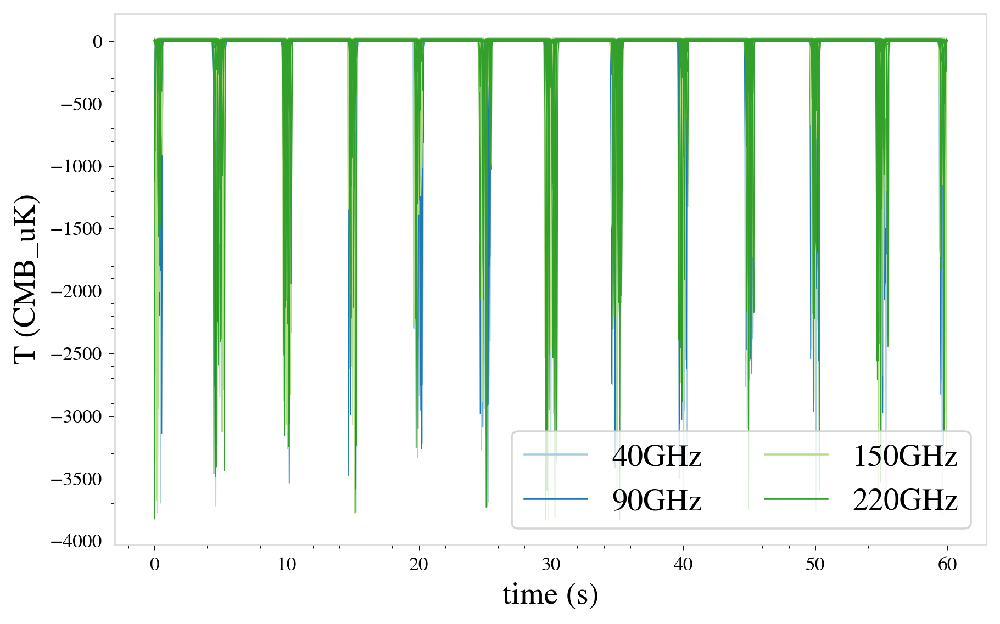

In [52]:

fig, ax = plt.subplots(1,1,figsize=(8,5), dpi=256)

nt = 12000
nt = len(model.plan.time)

D  = map_data[:,:nt].copy()
D -= D.mean(axis=1)[:,None]

for ib, b in enumerate(model.array.ubands):

    bm = model.array.bands == b

    for d in D[bm]:

        ax.plot(model.plan.time[:nt], d, c=HEX_list[ib], lw=5e-1)

    ax.plot(model.plan.time[:nt], d, c=HEX_list[ib], label=f'{int(1e-9*b)}GHz')

ax.legend(ncol=2)
ax.set_xlabel('time (s)')
ax.set_ylabel('T (CMB_uK)')


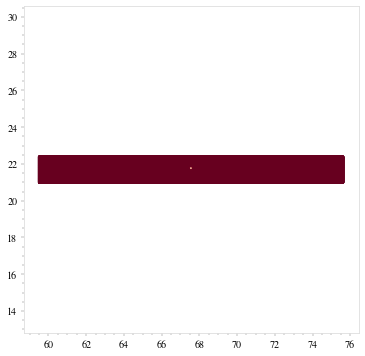

In [37]:

fig, ax = plt.subplots(1,1,figsize=(6,6))
ax.scatter(np.degrees(BRA), np.degrees(BDEC), c=FB_map_TRJ, s=1)
#ax.plot(np.degrees(model.ra).T, np.degrees(model.dec).T)

xs = ax.get_xlim()
ys = ax.get_ylim()

x0, y0 = np.mean(xs), np.mean(ys)
r = 0.5 * np.maximum(np.ptp(xs), np.ptp(ys))

ax.set_xlim(x0-r,x0+r)
ax.set_ylim(y0-r,y0+r)

plt.show()

In [198]:
np.ptp(map_X)

0.0048481368110953596

In [199]:
map_RA, map_DEC = tools.from_xy(map_X, map_Y, model.ra.mean(), model.dec.mean())

In [145]:
import ephem

observer = ephem.Observer()
observer.lon = np.radians(0)
observer.lat = np.radians(90)
observer.elevation = 0
observer.date = 
observer.radec_of(0, np.pi/2)

SyntaxError: invalid syntax (1678870252.py, line 7)

In [146]:
ae_to_rd(az, el, lst, lat)

NameError: name 'ae_to_rd' is not defined

In [147]:
azim_sample, elev_sample = np.linspace(model.azim.min(), model.azim.max(), 64), np.linspace(model.elev.min(), model.elev.max(), 64)

RA, DEC = np.vectorize(observer.radec_of)(*np.meshgrid(azim_sample, elev_sample))


86164.091

In [154]:
#plt.plot((model.azim - model.azim.max())[0] % (2*np.pi))

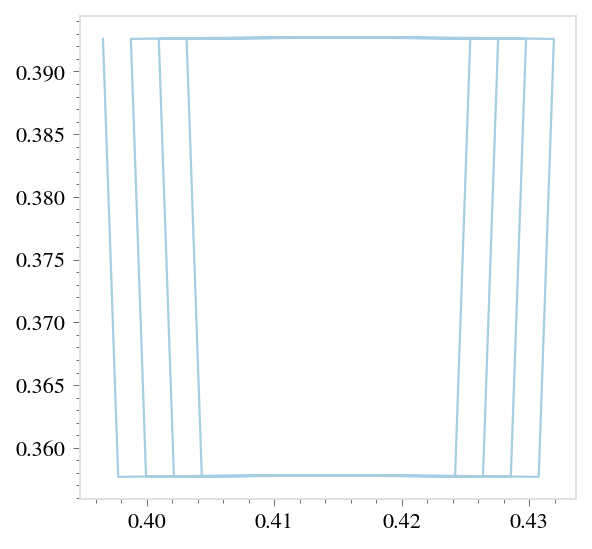

In [189]:
# LST=100.46+0.985647*d+long+15⋅UT



model.plan.J2000 = (model.plan.time - J0) % 86400



plt.plot(ra[0], dec[0])

In [171]:
np.degrees(dec)

-23.499999999999993

In [164]:
plt.plot(ra[0])

IndexError: invalid index to scalar variable.

In [127]:
from scipy.interpolate import RegularGridInterpolator as rgi


%time ra_rgi = rgi((azim_sample, elev_sample), RA)((model.azim, model.elev))

CPU times: user 92 ms, sys: 18.6 ms, total: 111 ms
Wall time: 108 ms


In [117]:
model.azim.shape

(256, 2400)

In [116]:
%time x(model.azim, model.elev)

CPU times: user 1.59 s, sys: 32.7 ms, total: 1.62 s
Wall time: 1.63 s


(array([[1.85723523, 1.85725357, 1.85727195, ..., 1.85375227, 1.85491327,
         1.85607425],
        [1.85833705, 1.85835647, 1.85837593, ..., 1.85485413, 1.85601511,
         1.85717608],
        [1.85832089, 1.85834028, 1.85835971, ..., 1.85483796, 1.85599895,
         1.85715992],
        ...,
        [1.84742379, 1.84743257, 1.84744135, ..., 1.84394064, 1.8451017 ,
         1.84626275],
        [1.84852577, 1.84853563, 1.8485455 , ..., 1.84504266, 1.8462037 ,
         1.84736474],
        [1.84962864, 1.84963958, 1.84965053, ..., 1.84614556, 1.8473066 ,
         1.84846762]]),
 array([[0.69522772, 0.69639197, 0.69755622, ..., 0.69526006, 0.69524928,
         0.6952385 ],
        [0.69570238, 0.69686662, 0.69803085, ..., 0.69573471, 0.69572393,
         0.69571315],
        [0.69473218, 0.69589642, 0.69706065, ..., 0.69476451, 0.69475373,
         0.69474295],
        ...,
        [0.6996614 , 0.70082567, 0.70198994, ..., 0.69969383, 0.69968301,
         0.6996722 ],
        [0.7

In [104]:
datetime.fromtimestamp(model.plan.time[0])

datetime.datetime(1969, 12, 31, 19, 0)

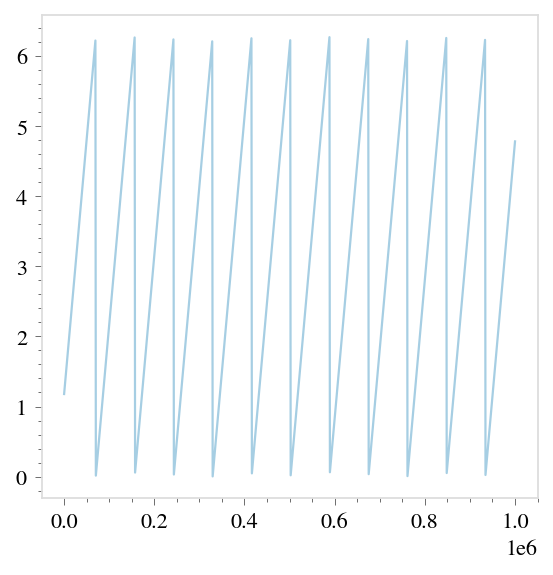

In [85]:
model.plan.lst = 2 * np.pi * model.plan.time / 86400



def get_lst(utc, lon):

    return (2 * np.pi * (utc / 86400) - lon) % (2 * np.pi)

t = np.linspace(0,1e6,1024)

plt.plot(t, get_lst(t, np.radians(-67.5)))

In [94]:
model.plan.lst = get_lst(model.plan.time, np.radians(model.site.longitude))

ra, dec = maria.tools.ae_to_rd(model.azim, 0, model.plan.lst, np.radians(model.site.latitude))
ra.mean(), dec.mean()

(1.1826309273963016, 1.1548206541303536)

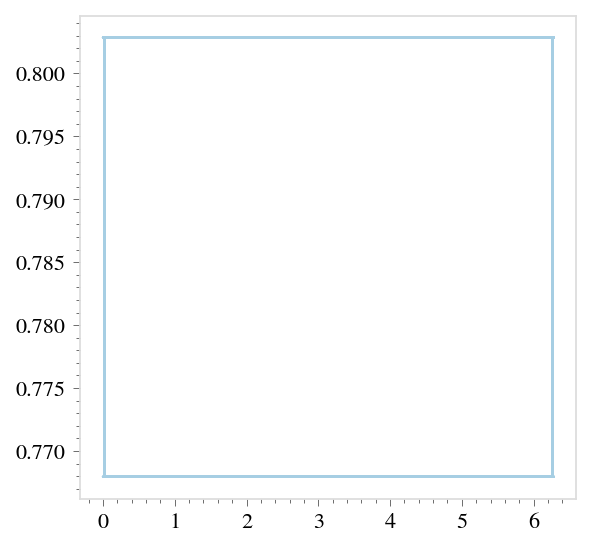

In [150]:
plt.plot(model.azim[0], model.elev[0])

In [86]:
model.site.longitude

-67.5

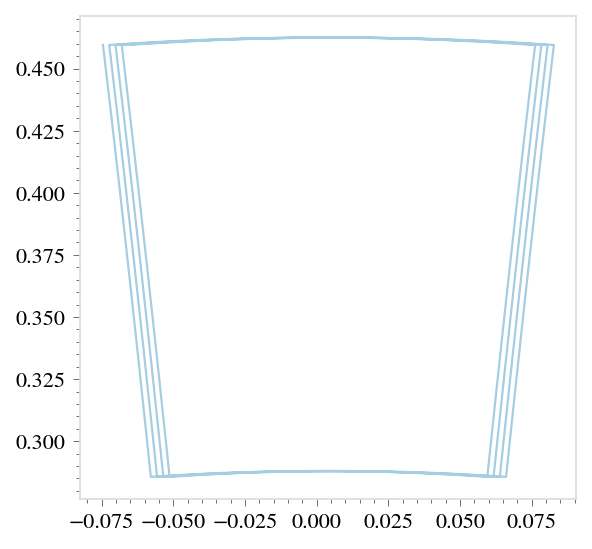

In [81]:
plt.plot(ra[0], dec[0])

In [80]:

fluc_norm = np.square(site.weather['pwv_rms']) * np.square(model.layer_scaling) / np.square(model.layer_scaling).sum(axis=0)

In [66]:
plan.o

AttributeError: 'plan' object has no attribute 'o'

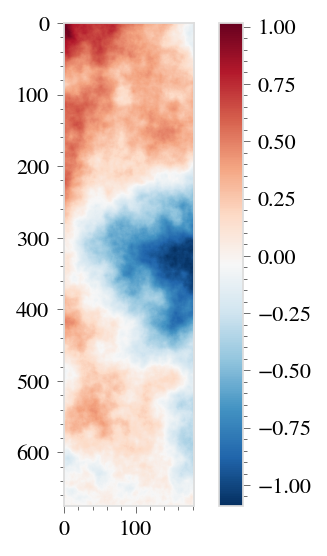

In [83]:
plt.imshow(model.vals[0])
plt.colorbar()

In [84]:
self.rel_flucs.astype(float).std(axis=(1,2))

array([0.41890984, 0.44905829, 0.49508883, 0.70774142, 0.79545871])

In [85]:
self.A[0].sum(axis=1)

array([0.99979544, 0.99986815, 0.99989265, 0.9999107 , 0.99992424,
       0.9999309 , 0.9999352 , 0.99994004, 0.9999447 , 0.99994636,
       0.99994767, 0.9999503 , 0.9999532 , 0.999954  , 0.99995476,
       0.99995697, 0.99996024, 0.99996203, 0.9999633 , 0.99996364,
       0.99996334, 0.9999623 , 0.9999617 , 0.9999627 , 0.9999639 ,
       0.9999636 , 0.9999634 , 0.9999644 , 0.99996567, 0.9999652 ,
       0.999965  , 0.99996614, 0.99996734, 0.99996746, 0.99996734,
       0.99996805, 0.9999689 , 0.99996924, 0.9999685 , 0.99996847,
       0.9999692 , 0.99996984, 0.99996966, 0.99996924, 0.99996996,
       0.9999707 , 0.9999705 , 0.9999705 , 0.9999711 , 0.99997175,
       0.99997175, 0.9999715 , 0.9999722 , 0.999973  , 0.9999734 ,
       0.9999733 , 0.99997365, 0.999974  , 0.9999734 , 0.99997336,
       0.9999737 , 0.99997413, 0.9999737 , 0.99997354, 0.9999741 ,
       0.9999743 , 0.999974  , 0.9999738 , 0.9999742 , 0.9999748 ,
       0.9999746 , 0.9999746 , 0.9999745 , 0.99997485, 0.99997

In [86]:
self.epwv_data  = self.rel_flucs * np.sqrt(np.square(self.site.weather['pwv_rms']) * np.square(self.layer_scaling))[:,None,:]
self.epwv_data /= (self.n_layers * np.sin(maria.tools.from_xy(*self.array.offsets.T[:,:,None], 0, model.plan.c_elev)[1]))

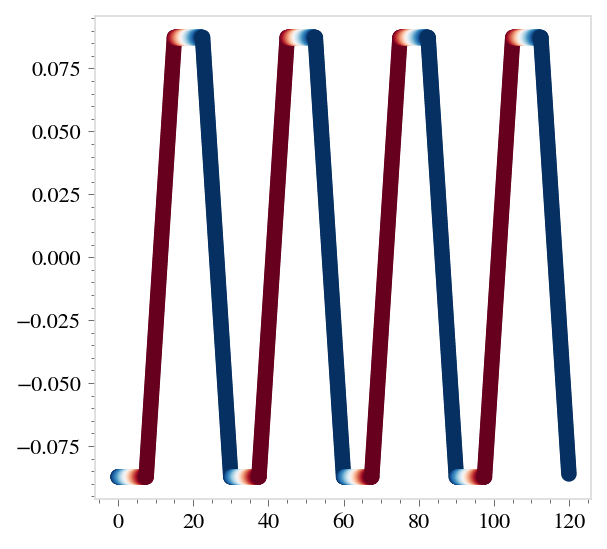

In [92]:
plt.scatter(model.plan.time, model.plan.c_azim, c=model.plan.c_elev)

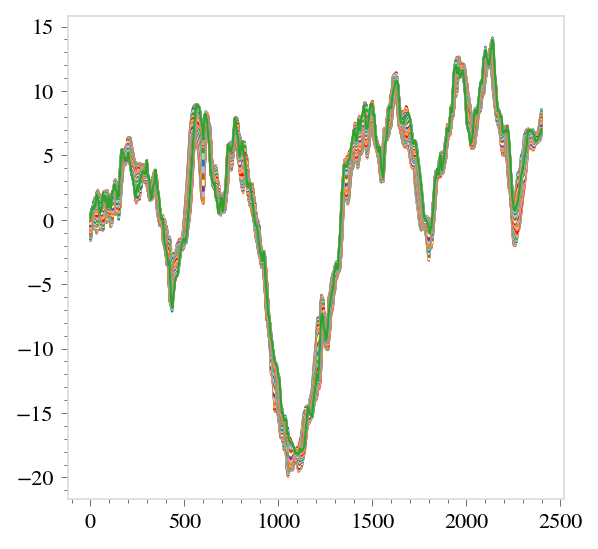

In [87]:
plt.plot(self.epwv_data.sum(axis=0).T)
plt.show()

In [ ]:
np.square(site.weather['pwv_rms']) * 

In [30]:
model.layer_scaling

array([[5.77844623, 5.77954593, 5.78064554, ..., 5.77844623, 5.77844623,
        5.77844623],
       [5.45449619, 5.45402935, 5.45356214, ..., 5.45449619, 5.45449619,
        5.45449619],
       [2.78092262, 2.77992134, 2.77891977, ..., 2.78092262, 2.78092262,
        2.78092262],
       [1.01998018, 1.01897487, 1.01796937, ..., 1.01998018, 1.01998018,
        1.01998018]])

Generating layers: 100%|██████████| 12555/12555 [00:04<00:00, 2606.39it/s]


In [286]:
model.rel_flucs.shape

(2, 256, 12000)

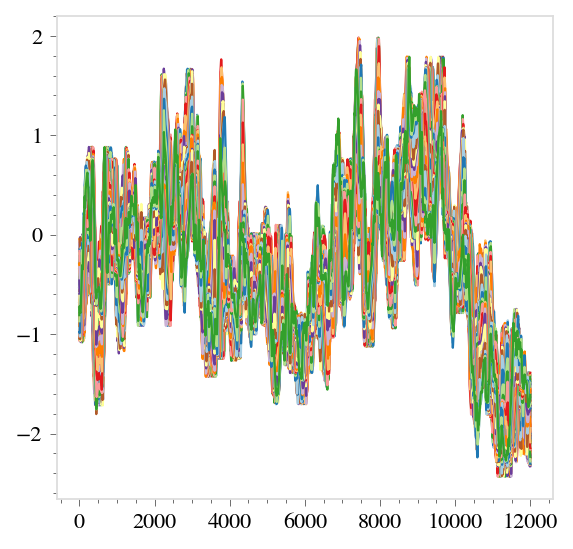

In [287]:
plt.plot(model.rel_flucs[1].T)
plt.show()


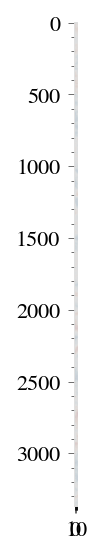

In [149]:
plt.imshow(model.vals[0].astype(float))

In [251]:
i_d = 0
i_f = 0

multichromatic_beams = False

for i_d, d in enumerate(model.depths):
    
    if multichromatic_beams:
    
        filtered_vals   = np.zeros((len(model.array.nu), *model.vals[i_d].shape), dtype=model.data_type)
        angular_res = model.lay_ang_res[i_d]

        print(filt_vals.shape)

        for i_f, f in enumerate(model.array.nu):

            angular_waist = model.angular_waists[i_d, i_f]

            F = model.array.make_filter(angular_waist, angular_res, model.array.beam_func)
            u, s, v = model.array.separate_filter(F)

            filtered_vals[i_f] = model.array.separably_filter(model.vals[i_d], u, s, v).astype(model.data_type)
            
    else:
        
        angular_res   = model.lay_ang_res[i_d]
        angular_waist = model.angular_waists[i_d, i_f].mean()

        F = model.array.make_filter(angular_waist, angular_res, model.array.beam_func)
        u, s, v = model.array.separate_filter(F)

        filtered_vals = model.array.separably_filter(model.vals[i_d], u, s, v).astype(model.data_type)

In [242]:
self = model

FRGI = sp.interpolate.RegularGridInterpolator((self.para[i_d], self.orth[i_d]), self.lay_scaling[i_d] * filtered_vals)
            

ValueError: operands could not be broadcast together with shapes (1200,) (675,358) 

In [253]:
self = model

EPWV = sp.interpolate.RegularGridInterpolator((self.para[i_d], self.orth[i_d]), filtered_vals)((self.p[i_d], self.o[i_d]))
            

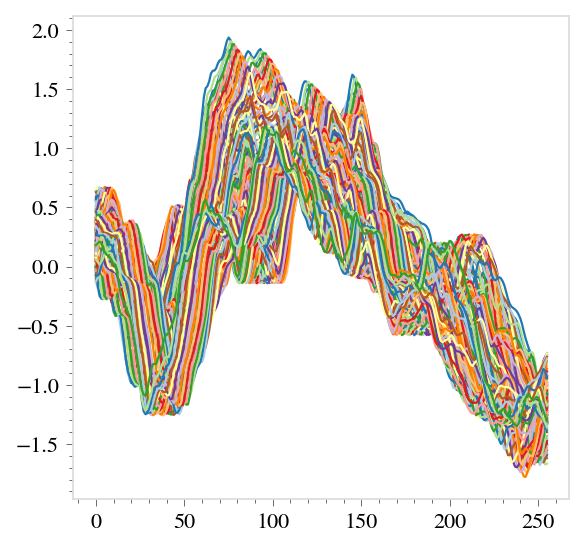

In [258]:
plt.plot(EPWV[:,:256].T)
plt.show()

In [ ]:
self.para[i_d]

In [244]:
i_d = 1

print(self.p[i_d].min(), self.p[i_d].max())
print(self.para[i_d].min(), self.para[i_d].max())

-0.07685334374339767 0.3401912122814538
-0.07948351959597512 0.342209065559014


In [245]:
model.padding

array([0.00400226, 0.00200452])

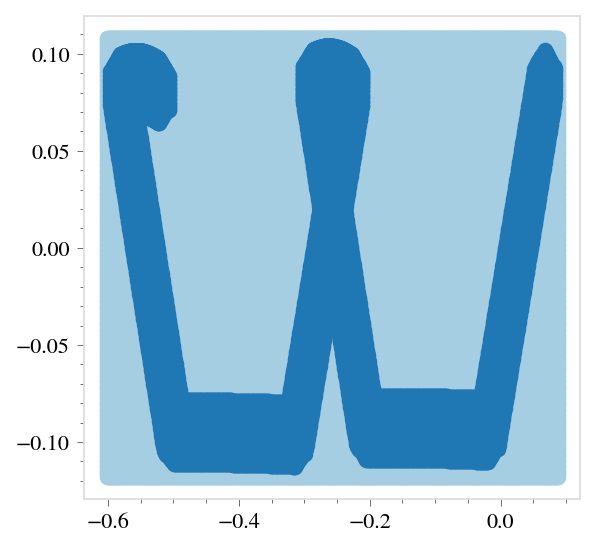

In [246]:
i_d = 0

plt.scatter(*np.meshgrid(self.para[i_d], self.orth[i_d]))
plt.scatter(self.p[i_d], self.o[i_d])
plt.show()

In [151]:
from scipy.interpolate import RegularGridInterpolator as rgi

EPWV = sp.interpolate.RegularGridInterpolator((self.para[i_d], self.orth[i_d]), filtered_vals)((self.p[i_d], self.o[i_d]))

rgi

In [161]:
self.lay_scaling[i_d].shape

(1200,)

In [145]:
np.degrees(angular_waist), 

0.14356311250114662

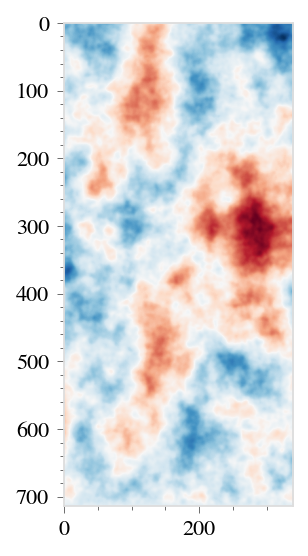

In [144]:
plt.imshow(filt_vals.astype(float))

In [134]:
model.waists[i_d]

array([5.011298  , 5.01110173, 5.01091053, 5.01072423, 5.01054266,
       5.01036566, 5.01019308, 5.01002477, 5.00986059, 5.00970041,
       5.00954411, 5.00939155, 5.00924261, 5.0090972 , 5.00895518,
       5.00881647, 5.00868095, 5.00854853, 5.00841912, 5.00829262,
       5.00816895, 5.00804803, 5.00792977, 5.0078141 , 5.00770094,
       5.00759022, 5.00748187, 5.00737583, 5.00727202, 5.00717038,
       5.00707087, 5.00697341, 5.00687795, 5.00678444, 5.00669282,
       5.00660304, 5.00651506, 5.00642882, 5.00634429, 5.00626141,
       5.00618014, 5.00610045, 5.00602228, 5.00594561, 5.0058704 ,
       5.0057966 , 5.00572418, 5.00565312, 5.00558337, 5.0055149 ,
       5.00544768, 5.00538168, 5.00531688, 5.00525324])

In [130]:
angular_waist

0.0025026266181304743

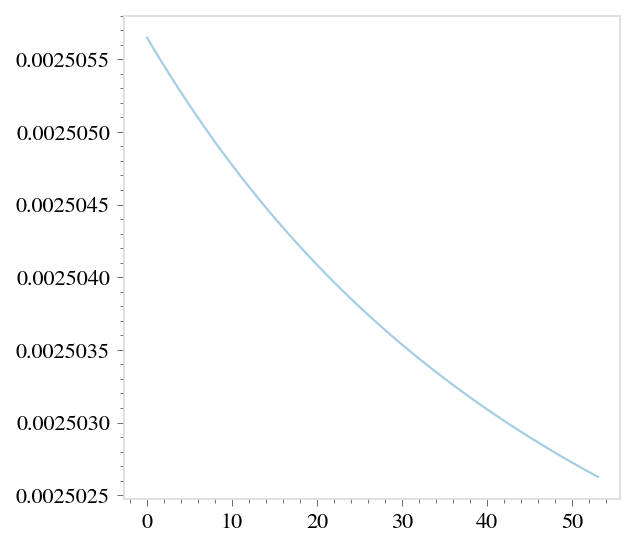

In [131]:
plt.plot(model.angular_waists[i_d])

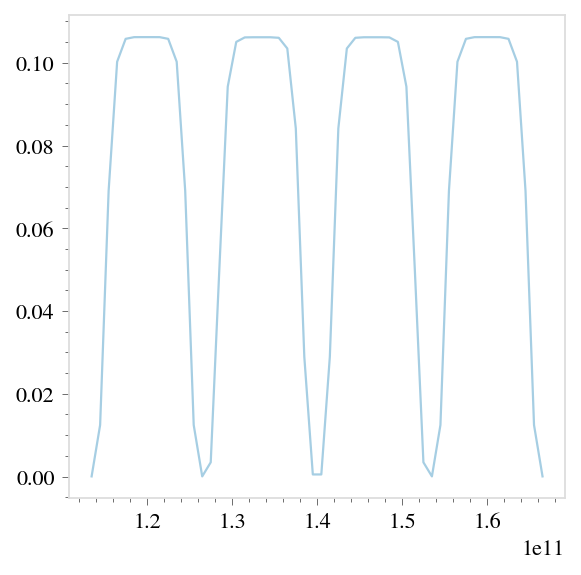

In [132]:
plt.plot(model.array.nu, model.array.passbands.max(axis=0))

In [126]:
filt_vals[0] - filt_vals[-1]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float16)

In [44]:
model.array.separably_filter(model.vals[i_l].astype(float), u, s, v).shape

(2393, 192)

In [45]:
model.vals[i_l].shape

(2393, 192)

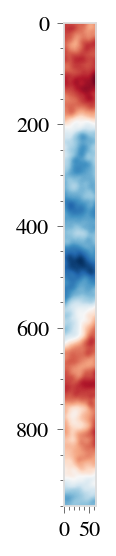

In [20]:
plt.imshow(model.array.separably_filter(model.vals[i_l],u, s, v))

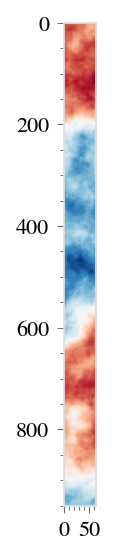

In [19]:
plt.imshow(model.vals[0])

In [138]:
model.depths

array([1000., 2000.])

In [206]:
i_l = 0
i_f = 0

model.angular_waists[i_l]

array([0.00500179, 0.00500174, 0.0050017 , 0.00500165, 0.00500161,
       0.00500157, 0.00500153, 0.00500149, 0.00500145, 0.00500141,
       0.00500138, 0.00500135, 0.00500131])

In [211]:
model.n_layers

2

In [221]:
for i_l, l in enumerate(model.depths):
    for i_f, f in enumerate(model.array.nu):

        waist = model.angular_waists[i_l, i_f]

        filter_width_per_waist = 1.5

        filter_width = filter_width_per_waist * waist

        n_filter = 2 * int(np.ceil(0.5 * filter_width / model.lay_ang_res[i_l])) + 1

        filter_side = 0.5 * np.linspace(-filter_width, filter_width, n_filter)

        FILTER_X, FILTER_Y = np.meshgrid(filter_side, filter_side, indexing='ij')
        FILTER_R = np.sqrt(np.square(FILTER_X) + np.square(FILTER_Y))

        FILTER  = model.array.beam_func(FILTER_R, 0.5 * waist)
        FILTER /= FILTER.sum()

        thresh = 0.9

        filtered = 0
        for m in range(np.where(np.cumsum(s) / np.sum(s) > thresh)[0][0] + 1):

            filtered += s[m] * sp.ndimage.filters.convolve1d(sp.ndimage.filters.convolve1d(raw, v[m], axis=0), v[m], axis=1)
            
        

In [209]:
%time u, s, v = la.svd(FILTER)
s

CPU times: user 202 µs, sys: 45 µs, total: 247 µs
Wall time: 215 µs


array([1.09655974e-01, 1.77924733e-02, 4.85465176e-03, 1.53254037e-03,
       4.62320488e-04, 1.57149708e-05, 1.35854094e-05, 3.24941131e-17,
       8.58144901e-18, 4.62905979e-18, 1.20580224e-18, 4.93380458e-19,
       1.18279558e-19, 3.73126334e-22, 7.63514782e-27])

In [186]:
raw = model.vals[i_l].copy()

In [187]:
#plt.plot(v[0])

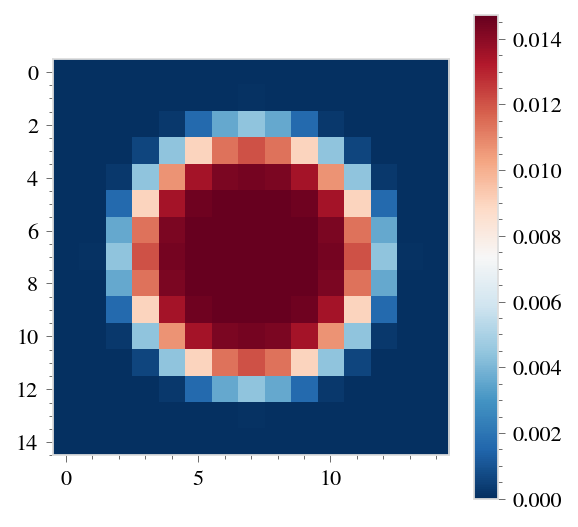

In [210]:
plt.imshow(FILTER)
plt.colorbar()

In [97]:
model.array.beam_func()

TypeError: <lambda>() missing 2 required positional arguments: 'r' and 'r_fwhm'

In [62]:
i_l = 0

model.radii = 0.5 * model.waists
model.lay_ang_res[i_l]

0.0046780351198783985

In [ ]:
filter_width_per_waist = 1.5

n

filter_width_per_waist * np.arange(-0.5, 0.5, )

In [60]:
model.radii[0]

array([25.0000009 , 25.00000087, 25.00000085, 25.00000083, 25.0000008 ,
       25.00000078, 25.00000076, 25.00000074, 25.00000072, 25.00000071,
       25.00000069, 25.00000067, 25.00000066])

In [57]:
#model.waists

In [53]:
model.X[0]

array([[-0.18569226, -0.18517663, -0.18466101, ..., -0.15423923,
        -0.15372361, -0.15320799],
       [-0.18104273, -0.1805271 , -0.18001148, ..., -0.1495897 ,
        -0.14907408, -0.14855845],
       [-0.17639319, -0.17587757, -0.17536195, ..., -0.14494017,
        -0.14442455, -0.14390892],
       ...,
       [ 2.64587255,  2.64638818,  2.6469038 , ...,  2.67732558,
         2.6778412 ,  2.67835683],
       [ 2.65052209,  2.65103771,  2.65155333, ...,  2.68197511,
         2.68249073,  2.68300636],
       [ 2.65517162,  2.65568724,  2.65620286, ...,  2.68662464,
         2.68714027,  2.68765589]])

In [44]:
from astropy.io import fits
hdul = fits.open('maps/tsz.fits')
#plt.imshow(-5.37 * hdul[0].data)
#plt.colorbar()

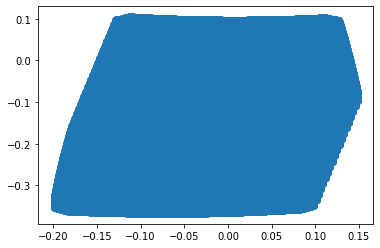

In [706]:
plt.scatter(model.rel_c_x[-1][None,:] + model.array.offset_x[:,None],
            model.rel_c_y[-1][None,:] + model.array.offset_y[:,None])

In [ ]:
w = model.angular_waists[i_l].mean()
model.array.get_beam_filter()

In [707]:
i_l = 0
res = model.lay_ang_res[i_l]

raw = model.vals[i_l]

filt = np.zeros(())

In [708]:
[60 * np.degrees(x) for x in model.lay_ang_res]

[21.315583193208916,
 19.304075981479347,
 14.323948266166985,
 10.742963175897726,
 8.594372573455171,
 7.161979214925698,
 6.138841424346279,
 5.371488363735353,
 4.7746584564364625,
 4.297194756455689]

In [709]:
[60 * np.degrees(x.mean()) for x in model.angular_waists]

[171.88734668976375,
 85.94368557065577,
 57.29580396462751,
 42.97186723686593,
 34.37750846040738,
 28.647938659596413,
 24.55539113058002,
 21.485982521430984,
 19.09866652552252,
 17.18881535887803]

In [711]:
34.38152563429087 / 4.2974640910153665

8.000421854872906

In [712]:
n_bf = int(np.ceil(.5 * w / res))
n_bf

5

In [713]:
model.array.get_beam_filter()

TypeError: <lambda>() missing 3 required positional arguments: 'dx', 'dy', and 'w'

In [714]:
beam_side = np.arange(-2 * n_bf, 2 * n_bf)
DX, DY = np.meshgrid(beam_side, beam_side)

BF = model.array.get_beam_filter(DX, DY, w / res)
BF /= BF.sum()

In [715]:
%time f = sp.signal.convolve2d(raw, BF, boundary='symm', mode='same')

CPU times: user 16.8 ms, sys: 127 µs, total: 16.9 ms
Wall time: 16.9 ms


In [734]:
from numpy import linalg as la

t0 = ttime.time()

u, s, v = la.svd(BF)

t0 = ttime.time()

eff_filter = np.zeros(BF.shape)

filtered = np.zeros(raw.shape)
total_s  = 0
mode     = 0
for i, (_u, _s, _v) in enumerate(zip(u.T, s, v)):
    
    filtered_mode = sp.ndimage.filters.convolve1d(raw,           _u, axis=0)
    filtered_mode = sp.ndimage.filters.convolve1d(filtered_mode, _v, axis=1)
    
    eff_filter += _s * np.outer(_u, _v)
    
    filtered += _s * filtered_mode
    total_s += _s
    mode += 1
    print(_s)
    
    if i == 2: break
    
t1 = ttime.time()

t1 - t0

0.06645079166593985
0.010809575593085057
0.003037819547017024


0.004240274429321289

In [725]:
model.array.passbands

array([[7.86438349e-13, 3.04427398e-05, 1.24511210e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [7.86438349e-13, 3.04427398e-05, 1.24511210e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [7.86438349e-13, 3.04427398e-05, 1.24511210e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        6.90570005e-02, 1.24511210e-02, 3.04427398e-05],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        6.90570005e-02, 1.24511210e-02, 3.04427398e-05],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        6.90570005e-02, 1.24511210e-02, 3.04427398e-05]])

In [717]:
BF.max()

0.005401303241085676

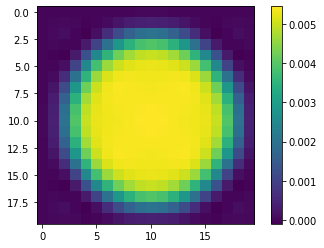

In [735]:
plt.imshow(eff_filter)
plt.colorbar()

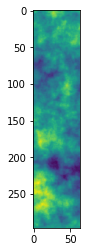

In [737]:
plt.imshow(raw)

In [720]:
%time f = sp.signal.convolve2d(raw, BF, boundary='symm', mode='same')

CPU times: user 17.7 ms, sys: 97 µs, total: 17.8 ms
Wall time: 17.8 ms


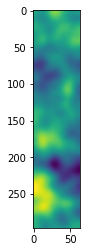

In [738]:
plt.imshow(f)

In [722]:
u,s,v = la.svd()

TypeError: _svd_dispatcher() missing 1 required positional argument: 'a'

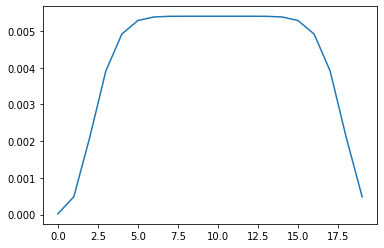

In [723]:
plt.plot(BF[2*n_bf])



In [432]:
np.degrees(w) * 60

34.38907163748927

In [415]:
np.degrees(res)

0.015016006529325051

In [400]:
model.angular_waists[i_l].mean()

0.0010326658049368603

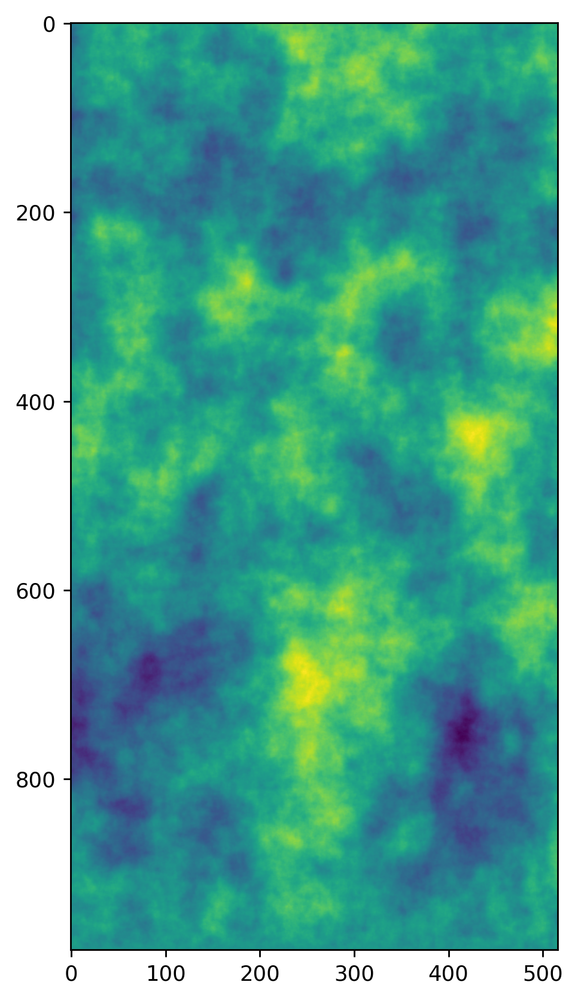

In [390]:
plt.figure(dpi=256, figsize=(8,8))
plt.imshow(model.vals[-1])

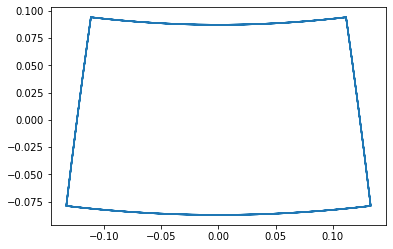

In [356]:
#plt.plot(model.w_v_x[0])
plt.plot(model.plan.c_x, model.plan.c_y)
plt.plot(model.plan.c_x + np.cumsum(), model.plan.c_y)

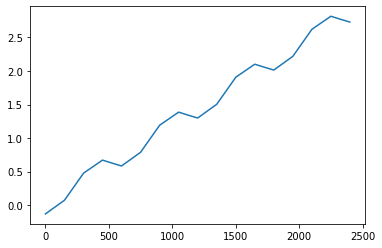

In [374]:
plt.plot(model.rel_c_x[0])

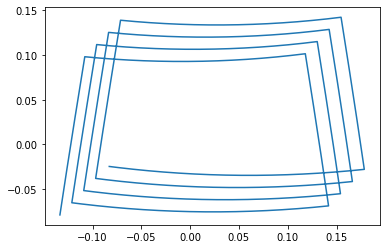

In [363]:
plt.plot(model.plan.c_x + np.cumsum(model.w_v_x * plan.dt, axis=1)[-1], 
         model.plan.c_y + np.cumsum(model.w_v_y * plan.dt, axis=1)[-1])

In [331]:
model.theta_y.shape

(256, 2400)

In [326]:
plan.c_x.shape

(2400,)

In [336]:
model.w_v_x.shape

(5, 2400)

In [313]:
model.sim()

NameError: name 'ttime' is not defined

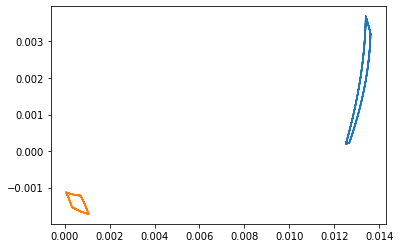

In [311]:
plt.plot(model.wind_x_v[0], model.wind_y_v[0])
plt.plot(model.wind_x_v[-1], model.wind_y_v[-1])

In [304]:
plt.imshow(model.vals[0])

AttributeError: 'lam' object has no attribute 'vals'

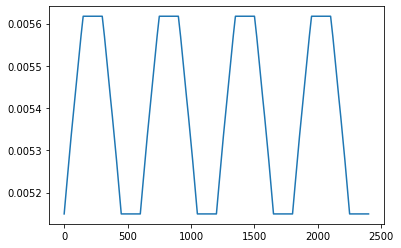

In [299]:
plt.plot(model.lay_scaling[0])

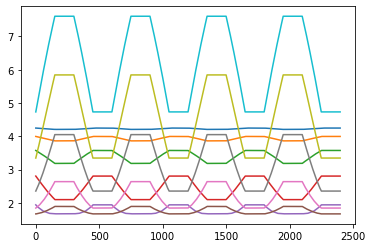

In [212]:
plt.plot(model.w_n.T)
plt.show()

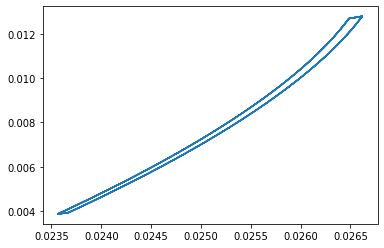

In [213]:
plt.plot(model.wind_x_v[0], model.wind_y_v[0])
plt.show()

In [214]:
model.wind_x[0]

AttributeError: 'lam' object has no attribute 'wind_x'

In [111]:
import weathergen

In [112]:
model.weather['pwv']

7.265072980923543

CPU times: user 645 µs, sys: 481 µs, total: 1.13 ms
Wall time: 616 µs


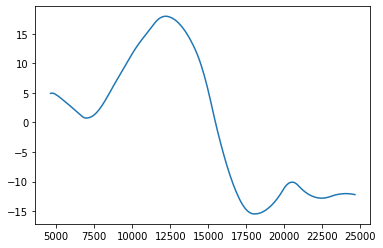

In [83]:
%time weather = weathergen.generate(region='chajnantor', time=0, method='random')
plt.plot(weather['height'], weather['wind_east'])

In [76]:
weather.keys()

dict_keys(['lpwv', 'lnwd', 'temperature', 'wind_east', 'wind_north', 'pwv', 'water_density', 'height'])

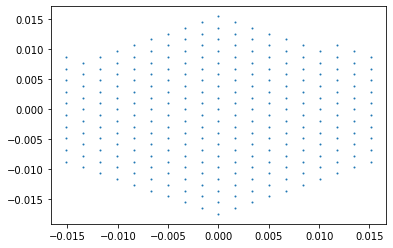

In [63]:
plt.scatter(array.offset_x, array.offset_y, s=1)

In [6]:
layer_beam_edges.shape

NameError: name 'layer_beam_edges' is not defined

In [9]:
waist_sample_prop + beam_tol

NameError: name 'waist_sample_prop' is not defined

In [10]:
layer_array_hulls = [sp.spatial.qhull.ConvexHull(np.c_[x.ravel(),y.ravel()]) for x, y in zip(np.real(layer_beam_edges_z), np.imag(layer_beam_edges_z))]

NameError: name 'layer_beam_edges_z' is not defined

In [11]:
layer_array_hull_x, layer_array_hull_y = [h.points[h.vertices][:,0] for h in layer_hulls], [h.points[h.vertices][:,1] for h in layer_hulls]


NameError: name 'layer_hulls' is not defined

In [12]:
#layer_hull_x

In [457]:
i_layer = 0

array_hull_x, array_hull_y = layer_array_hull_x[i_layer], layer_array_hull_y[i_layer]

In [458]:
max_layer_beam_radii = 0.5 * model.angular_waists.max(axis=1)

In [400]:
unit_z = np.exp(1j*np.linspace(0,2*np.pi,16+1)[:-1])

radius_sample_prop = 1.5
beam_tol = 1e-1

max_layer_beam_radii = 0.5 * model.angular_waists.max(axis=1)

layer_beam_edges_z = (radius_sample_prop + beam_tol) * max_layer_beam_radii[:,None,None] * unit_z[None,None,:] + array.offset_z[None,:,None]

In [459]:
max_layer_beam_radii

array([0.00500861, 0.00251718, 0.00169233, 0.00128402, 0.00104222,
       0.00088355, 0.00077228, 0.00069054, 0.00062838, 0.00057984])

In [463]:
padded_radius = max_layer_beam_radii + array.offset_r.max()
padded_radius

array([0.02246191, 0.01997048, 0.01914563, 0.01873732, 0.01849551,
       0.01833684, 0.01822558, 0.01814383, 0.01808167, 0.01803314])

In [7]:
max_layer_beam_radii = 0.5 * model.angular_waists.max(axis=1)

In [8]:
radius_sample_prop = 1.5
beam_tol = 1e-1

t0 = ttime.time()

unit_z = np.exp(1j*np.linspace(0,2*np.pi,64+1)[:-1])
unit_x, unit_y = np.real(unit_z), np.imag(unit_z)

padded_radius = (radius_sample_prop + beam_tol) * max_layer_beam_radii + array.offset_r.max()

edge_x = padded_radius[:,None,None] * unit_x[None,None,:] + plan.c_x[None,:,None]
edge_y = padded_radius[:,None,None] * unit_y[None,None,:] + plan.c_y[None,:,None]

hull_tdsr = 16

layer_array_hulls = [sp.spatial.qhull.ConvexHull(np.c_[x[::hull_tdsr].ravel(),y[::hull_tdsr].ravel()]) for x, y in zip(edge_x, edge_y)]

t1 = ttime.time()

for i_layer in range(model.n_layers):
    
    layer_array_hull = layer_array_hulls[i_layer]
    layer_hull_verts = layer_array_hull.points[layer_array_hull.vertices]
    
    print(layer_hull_verts.shape)
    
    mara = tools.get_MARA(layer_hull_verts[:,0] + 1j*layer_hull_verts[:,1])
    
t2 = ttime.time()

(122, 2)
(122, 2)
(122, 2)
(122, 2)
(122, 2)
(122, 2)
(122, 2)
(122, 2)
(122, 2)
(122, 2)


In [18]:
padded_radius

array([0.02546708, 0.02148079, 0.02016103, 0.01950773, 0.01912084,
       0.01886697, 0.01868895, 0.01855815, 0.0184587 , 0.01838104])

In [19]:
hull = sp.spatial.qhull.ConvexHull(np.c_[plan.c_x, plan.c_y])
h_x, h_y = hull.points[hull.vertices].T; h_z = h_x + 1j * h_y
layer_hull_z = h_z[:,None] * (np.abs(h_z[:,None]) + padded_radius[None,:]) / np.abs(h_z[:,None])

In [39]:
model.theta_z.shape

(256, 2400)

In [45]:
padded_radius[None,:]

array([[0.02546708, 0.02148079, 0.02016103, 0.01950773, 0.01912084,
        0.01886697, 0.01868895, 0.01855815, 0.0184587 , 0.01838104]])

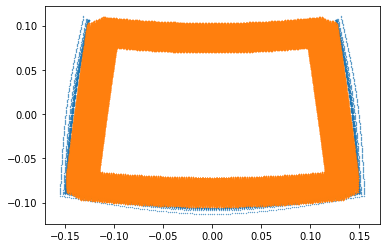

In [44]:
i_layer = 0

z = layer_hull_z

plt.scatter(np.real(z), np.imag(z), s=1e-1)



plt.scatter(np.real(model.theta_z), np.imag(model.theta_z), s=1e-1)

In [11]:
t1 - t0, t2 - t1

(0.034898996353149414, 0.05598616600036621)

In [486]:
i_layer = 0

layer_array_hull = layer_array_hulls[i_layer]
layer_hull_verts = layer_array_hull.points[layer_array_hull.vertices]

In [494]:
z = (layer_hull_verts[:,0] + 1j*layer_hull_verts[:,1]) * np.exp(1j*np.pi/2)

In [496]:
tools.get_MARA(layer_hull_verts[:,0] + 1j*layer_hull_verts[:,1])

0

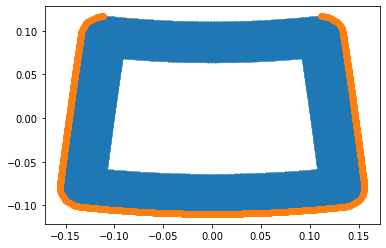

In [479]:
plt.scatter(edge_x, edge_y, s=1e-1)
plt.scatter(*array_hull.points[array_hull.vertices].T)

In [440]:
array_padding = (radius_sample_prop + beam_tol) * max_layer_beam_radii

array_padding.shape

(10,)

In [449]:
layer_hull_pts

[array([[-2.31287777e-02,  8.72664626e-03],
        [-2.31287777e-02, -8.72664626e-03],
        [-2.25187648e-02, -1.17933882e-02],
        [-2.07815950e-02, -1.43932465e-02],
        [-1.81817367e-02, -1.61304163e-02],
        [-3.06674197e-03, -2.48570626e-02],
        [-5.63805858e-18, -2.54670755e-02],
        [ 3.06674197e-03, -2.48570626e-02],
        [ 1.81817367e-02, -1.61304163e-02],
        [ 2.07815950e-02, -1.43932465e-02],
        [ 2.25187648e-02, -1.17933882e-02],
        [ 2.31287777e-02, -8.72664626e-03],
        [ 2.31287777e-02,  3.35640241e-03],
        [ 2.25474317e-02,  8.39100602e-03],
        [ 2.19374188e-02,  1.14577480e-02],
        [ 2.02002490e-02,  1.40576063e-02],
        [ 1.76003907e-02,  1.57947761e-02],
        [ 3.06674197e-03,  2.41857821e-02],
        [ 4.66887931e-18,  2.47957950e-02],
        [-3.06674197e-03,  2.41857821e-02],
        [-1.81817367e-02,  1.61304163e-02],
        [-2.07815950e-02,  1.43932465e-02],
        [-2.25187648e-02,  1.179

In [445]:
# (layer, frequency, detector, time)



# (layer, detector, time)

%time x = (model.x[None,:,:] - array.offset_x[None,:,None]) * ((array.offset_x[None,:,None] + array_padding[:,None,None]) / array.offset_x[None,:,None])

CPU times: user 138 ms, sys: 98.8 ms, total: 237 ms
Wall time: 239 ms


In [448]:
#x

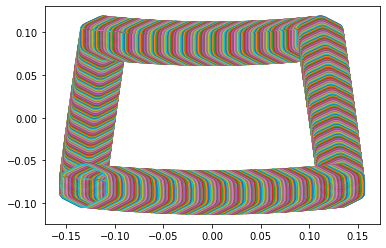

In [427]:
#plt.plot(pts[:,0][:,None] + plan.c_x[None,:], pts[:,1][:,None] + plan.c_y[None,:])
#plt.show()

In [421]:
pts[:,None,:] + np.c_[plan.c_x, plan.c_y][None,:,:]

array([[[-0.15654646, -0.07028201],
        [-0.15641533, -0.06912731],
        [-0.15628402, -0.06797262],
        ...,
        [-0.15123113, -0.0709277 ],
        [-0.1530032 , -0.07071537],
        [-0.15477498, -0.07050013]],

       [[-0.15654646, -0.0877353 ],
        [-0.15641533, -0.08658061],
        [-0.15628402, -0.08542591],
        ...,
        [-0.15123113, -0.08838099],
        [-0.1530032 , -0.08816866],
        [-0.15477498, -0.08795343]],

       [[-0.15593645, -0.09080204],
        [-0.15580532, -0.08964735],
        [-0.15567401, -0.08849265],
        ...,
        [-0.15062111, -0.09144774],
        [-0.15239319, -0.0912354 ],
        [-0.15416497, -0.09102017]],

       ...,

       [[-0.15159942, -0.06287824],
        [-0.15146829, -0.06172354],
        [-0.15133698, -0.06056885],
        ...,
        [-0.14628409, -0.06352393],
        [-0.14805616, -0.0633116 ],
        [-0.14982794, -0.06309636]],

       [[-0.15419928, -0.06461541],
        [-0.15406815, -0.06

In [417]:
pts.shape

(23, 2)

In [409]:
#scan_hull_pts = [np.concatenate([h_x[:,None] + plan.c_x[None,:], h_y[:,None] + plan.c_y[None,:]][:,:,None],axis=2) for h_x, h_y in zip(layer_hull_x, layer_hull_y)]

In [392]:
scan_hull_pts[0].shape

(58, 2400, 1)

In [378]:
#plt.plot(layer_hull_x[i], layer_hull_y[i])

In [364]:
layer_hull_points[0][:,None,:].shape

(29, 1, 2)

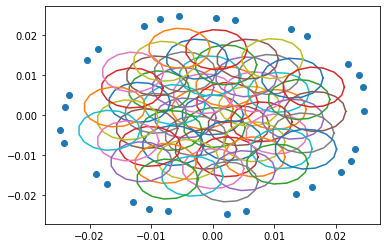

In [358]:
i = 0

h = layer_hulls[i]
r = max_layer_beam_radii[i]

plt.scatter(*h.points[h.vertices].T)
plt.plot(array.offset_x[None,:] + r * np.cos(np.linspace(0,2*np.pi,16))[:,None], 
            array.offset_y[None,:] + r * np.sin(np.linspace(0,2*np.pi,16))[:,None])
plt.show()

In [308]:
layer_hulls[0].vertices

array([1903, 1904, 1905, 1906, 1907, 1747, 1748, 2004, 2005, 2006, 2007,
       2008, 1848, 1849, 1850, 1851, 1691, 1947, 1948, 1949, 1950, 1951,
       1791, 1760, 2016, 2017, 2018, 2019, 2020, 1860, 1861, 1862, 1863,
       1703, 1704, 1960, 1961, 1962, 1963, 1803, 1804, 1805, 1806, 1646,
       1647], dtype=int32)

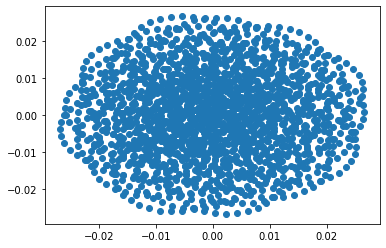

In [282]:


z = max_layer_beam_waist[:,None,None] * unit_z[None,:,None] + array.offset_z[None,None,:]
plt.scatter(np.real(z[0]), np.imag(z[0]))

In [255]:
model.array.offset_z[hull.vertices]

array([-0.00540714+0.01666758j, -0.01294281+0.01069399j,
       -0.01589918+0.00198148j, -0.01679421-0.00386431j,
       -0.01157223-0.01174284j, -0.0073311 -0.01607277j,
        0.00234056-0.01677597j,  0.01048641-0.01231986j,
        0.01512037-0.00856659j,  0.01661693+0.00084963j,
        0.01639335+0.0069549j ,  0.00969005+0.01407295j,
        0.00059524+0.01632247j])

In [248]:
model.angular_waists.max(axis=1)

array([0.01001723, 0.00503437, 0.00338467, 0.00256805, 0.00208444,
       0.0017671 , 0.00154457, 0.00138108, 0.00125676, 0.00115969])

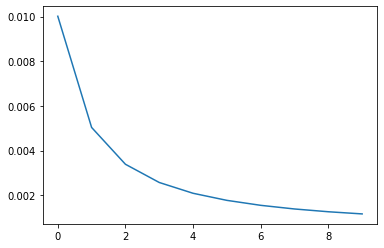

In [245]:
plt.plot(model.angular_waists.max(axis=1))

In [242]:
model.array.offset_z

array([ 0.00000000e+00+0.j        , -1.65432667e-03+0.0015155j ,
        2.77389941e-04-0.00316072j,  2.36436238e-03+0.00308389j,
       -4.41851516e-03-0.00078157j,  4.23289974e-03-0.00269262j,
       -1.42667149e-03+0.00530715j, -2.73589116e-03-0.00526779j,
        5.96067758e-03+0.00217683j, -6.22145667e-03+0.00256813j,
        3.00707703e-03-0.00642595j,  2.22697896e-03+0.00709996j,
       -6.72433326e-03-0.00389689j,  7.90057245e-03-0.00173692j,
       -4.82798684e-03+0.00686731j, -1.11666101e-03-0.0086172j ,
        6.86212433e-03+0.00578341j, -9.24250953e-03+0.00038221j,
        6.74705814e-03-0.00671422j, -4.51725728e-04+0.00976899j,
       -6.42854057e-03-0.00770354j,  1.01894370e-02+0.00137097j,
       -8.63805614e-03+0.00601013j,  2.36155491e-03-0.01049735j,
        5.46457642e-03+0.00953641j, -1.06870870e-02-0.00340947j,
        1.03850617e-02-0.00479816j, -4.50064102e-03+0.01075405j,
       -4.01802771e-03-0.01117114j,  1.06947759e-02+0.00562087j,
       -1.18825623e-02+0.

In [236]:
model.angular_waists.shape

(10, 270)

In [228]:
model.angular_waists

array([[0.01001723, 0.01001622, 0.01001529, ..., 0.01000067, 0.01000066,
        0.01000066],
       [0.00503437, 0.00503235, 0.00503051, ..., 0.00500135, 0.00500133,
        0.00500131],
       [0.00338467, 0.00338167, 0.00337893, ..., 0.00333535, 0.00333533,
        0.0033353 ],
       ...,
       [0.00138108, 0.00137371, 0.00136695, ..., 0.00125537, 0.00125531,
        0.00125524],
       [0.00125676, 0.00124866, 0.00124121, ..., 0.00111715, 0.00111708,
        0.00111701],
       [0.00115969, 0.00115091, 0.00114282, ..., 0.00100671, 0.00100663,
        0.00100655]])

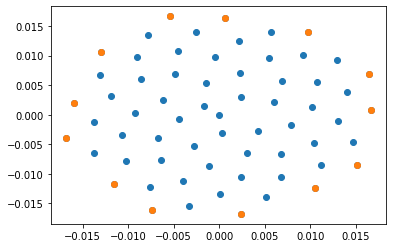

In [220]:

plt.scatter(*array.offsets.T)
plt.scatter(*hull.points[hull.vertices].T)

In [218]:
hull = sp.spatial.qhull.ConvexHull(array.offsets)
dir(hull)

['__class__',
 '__del__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_add_points',
 '_points',
 '_qhull',
 '_update',
 '_vertices',
 'add_points',
 'area',
 'close',
 'coplanar',
 'equations',
 'good',
 'max_bound',
 'min_bound',
 'ndim',
 'neighbors',
 'npoints',
 'nsimplex',
 'points',
 'simplices',
 'vertices',
 'volume']

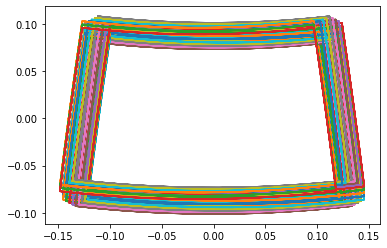

In [199]:
plt.plot(model.x.T, model.y.T)
plt.show()

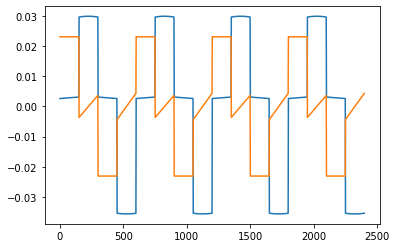

In [183]:
plt.plot(plan.c_x_v)
plt.plot(plan.c_y_v)

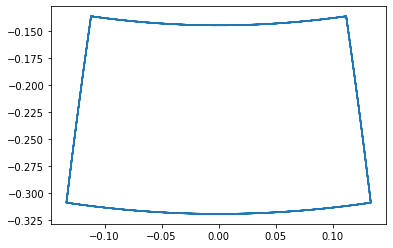

In [173]:
plt.plot(x, y)
#plt.plot(y)

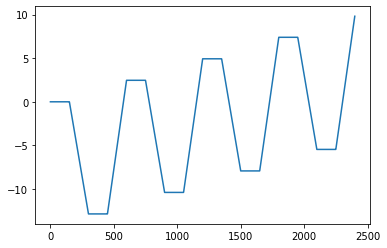

In [164]:
plt.plot(np.cumsum(plan.x_v*plan.dt))

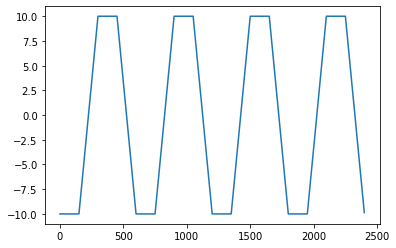

In [146]:
plt.plot(plan.azim)

In [133]:
array.x

array([-4.68489716e-17, -1.73205081e-01, -1.73205081e-01, -8.35883756e-17,
        1.73205081e-01,  1.73205081e-01,  1.43833684e-17, -3.46410162e-01,
       -3.46410162e-01, -3.46410162e-01, -1.73205081e-01, -1.20327780e-16,
        1.73205081e-01,  3.46410162e-01,  3.46410162e-01,  3.46410162e-01,
        1.73205081e-01,  7.56157083e-17, -1.73205081e-01, -5.19615242e-01,
       -5.19615242e-01, -5.19615242e-01, -5.19615242e-01, -3.46410162e-01,
       -1.73205081e-01, -1.57067184e-16,  1.73205081e-01,  3.46410162e-01,
        5.19615242e-01,  5.19615242e-01,  5.19615242e-01,  5.19615242e-01,
        3.46410162e-01,  1.73205081e-01,  1.36848048e-16, -1.73205081e-01,
       -3.46410162e-01, -6.92820323e-01, -6.92820323e-01, -6.92820323e-01,
       -6.92820323e-01, -6.92820323e-01, -5.19615242e-01, -3.46410162e-01,
       -1.73205081e-01, -1.93806587e-16,  1.73205081e-01,  3.46410162e-01,
        5.19615242e-01,  6.92820323e-01,  6.92820323e-01,  6.92820323e-01,
        6.92820323e-01,  

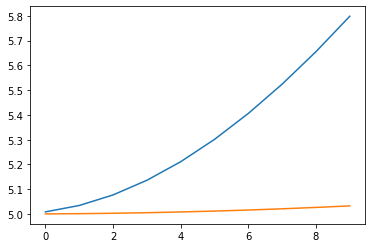

In [132]:
plt.plot(model.waists[:,0])
plt.plot(model.waists[:,-1])

In [125]:
array.bands

array([4.0e+10, 4.0e+10, 4.0e+10, 4.0e+10, 4.0e+10, 4.0e+10, 4.0e+10,
       4.0e+10, 4.0e+10, 4.0e+10, 4.0e+10, 4.0e+10, 4.0e+10, 4.0e+10,
       4.0e+10, 4.0e+10, 8.0e+10, 8.0e+10, 8.0e+10, 8.0e+10, 8.0e+10,
       8.0e+10, 8.0e+10, 8.0e+10, 8.0e+10, 8.0e+10, 8.0e+10, 8.0e+10,
       8.0e+10, 8.0e+10, 8.0e+10, 8.0e+10, 1.2e+11, 1.2e+11, 1.2e+11,
       1.2e+11, 1.2e+11, 1.2e+11, 1.2e+11, 1.2e+11, 1.2e+11, 1.2e+11,
       1.2e+11, 1.2e+11, 1.2e+11, 1.2e+11, 1.2e+11, 1.2e+11, 1.6e+11,
       1.6e+11, 1.6e+11, 1.6e+11, 1.6e+11, 1.6e+11, 1.6e+11, 1.6e+11,
       1.6e+11, 1.6e+11, 1.6e+11, 1.6e+11, 1.6e+11, 1.6e+11, 1.6e+11,
       1.6e+11])

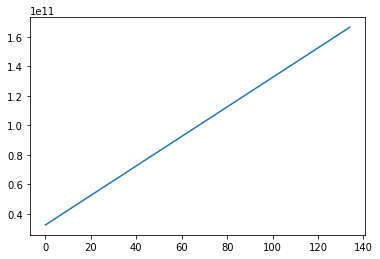

In [126]:
plt.plot(array.nu)

In [127]:
array.passbands

array([[7.86438349e-13, 3.04427398e-05, 1.24511210e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [7.86438349e-13, 3.04427398e-05, 1.24511210e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [7.86438349e-13, 3.04427398e-05, 1.24511210e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        6.90570005e-02, 1.24511210e-02, 3.04427398e-05],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        6.90570005e-02, 1.24511210e-02, 3.04427398e-05],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        6.90570005e-02, 1.24511210e-02, 3.04427398e-05]])

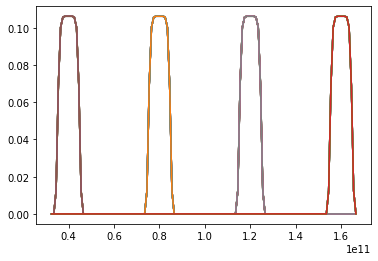

In [128]:
for i_det in range(array.n_det):

    plt.plot(array.nu, array.passbands[i_det])

In [77]:
array.passbands.shape

(64, 75)

In [ ]:
model = maria.lam(array, plan, site)

model.initialize()




In [54]:
offsets = np.random.standard_normal(size=(64,2))

In [55]:
datetime(2000,1,1).timestamp

<function datetime.timestamp>

In [72]:
def iterize(x):
    return np.array([x]).ravel()
    
iterize([5,10])

array([ 5, 10])

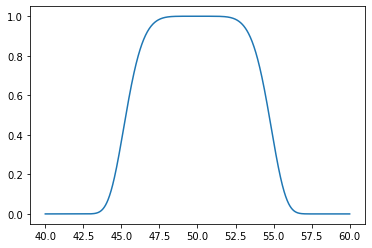

In [85]:
def get_passband(nu, nu_0, nu_w, order=4):
    return np.exp(-np.abs(2*(nu-nu_0)/nu_w)**order)

nu = np.linspace(40,60,1000)

plt.plot(nu, get_passband(nu, 50, 10, order=6))

In [74]:
np.repeat([5,10],5)

array([ 5,  5,  5,  5,  5, 10, 10, 10, 10, 10])

In [ ]:
self.beams.get_waist(self.atmosphere.depths[:,None],
                    self.beams.aperture,
                    self.array.nom_band_list[None,:])

In [59]:
model.depths

array([ 500., 1000., 1500., 2000.])

In [58]:
dir(model)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'config',
 'depths',
 'initialize',
 'max_depth',
 'min_depth',
 'n_layers',
 'put',
 'site_mode']

In [7]:
plan = maria.plan()

plan.put({'el_throw' : 5,
          'scan_type' : 'box',
          'duration' : 600}, verbose=True)

auto
set el_throw to 5
set scan_type to box
set duration to 600


In [ ]:
model = maria.lam()

In [21]:
plan.config

{'duration': 600,
 'sample_rate': 20,
 'scan_period': 30,
 'scan_type': 'box',
 'az': 0,
 'el': 45,
 'az_throw': 10,
 'el_throw': 5}

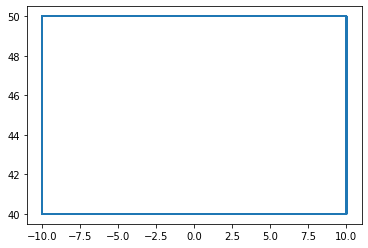

In [23]:
plt.plot(plan.azim, plan.elev)

auto
set n_det to 256
set fov to 2


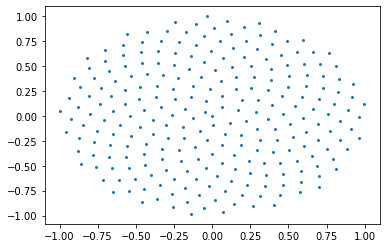

In [47]:
array = maria.array({'shape' : 'flower'})

#site = maria.site()


#plan = maria.plan()
array.put({'n_det' : 256, 'fov' : 2}, verbose=True)



plt.scatter(*array.offsets.T, s=4)

In [48]:

sp.signal


NameError: name 'sp' is not defined

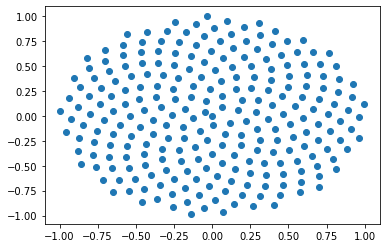

In [112]:
plt.scatter(*array.offsets.T)

In [ ]:

model = maria.lam()

model.initialize()
model.simulate()

In [ ]:
model.array

model.site

model.plans

In [ ]:
model.array()



In [6]:
model.array.offsets

AttributeError: 'Model' object has no attribute 'array'

In [20]:
array = telescope.Array()



site = telescope.Site()


#array.offsets

In [15]:
maria.model()

NameError: name 'maria' is not defined

In [25]:
from maria import model

model = maria.model(telescope='act')

model.put({'latitude' : 0,
           'longitude' : 0,
           'altitude' : 0})

model.initialize()

model.simulate()






TypeError: 'module' object is not callable

In [20]:
maria.telescope

NameError: name 'maria' is not defined